What I learned:

14/11/2024:

**Task:** get the crossroads with the most accidents<br>
**Challenge:** ta_crossroads is using multi string for it's crosswalk, crosswalk can be used as a crossroad.<br>
Some crosswalk can be combined to represent a crossroad.

In order to get accidents in a crossroad, we need to turn the crosswalk to a polygon and merge any relating polygon crosswalks together.

**Solution:**
```python
# Convex_hull turns any related group of points to a polygon.
ta_crossroads_['geometry'] = ta_crossroads_.geometry.convex_hull.buffer(10)  # Adjust buffer size

# Combine all geometries into a single multipolygon with merged overlaps
# This step will merge any overlapping polygons into a single geometry
merged_geometry = unary_union(ta_crossroads_.geometry)

# If you want each connected component as a separate polygon, convert the multipolygon back to individual polygons
crossroads_poly = gpd.GeoDataFrame(geometry=[merged_geometry], crs=ta_crossroads_.crs)

# Explode into individual polygons if merged into a MultiPolygon
crossroads_poly = crossroads_poly.explode(index_parts=True).reset_index(drop=True)
```

**Next problem:**<br>
We don't know what the created polygons relate to street wise.<br>
**Idea for a Solution:** use ta_street and ta_crossroads, *sjoin* them and get the names from the merged result 

---- 

16/11/2024

### Problem: Visualizing polygons and count next to them
When visualizing polygons and their related data on a map, it's often necessary to annotate each polygon with additional information. In this case, we want to display the counts of `index_right` (obtained from `i_m_h_ta_mm_crossroads_gdf_.value_counts(subset='index_right')`) above the corresponding polygons. The challenge is to position these annotations clearly without overlapping the polygons.

#### Solution
To solve this:
1. Calculated the counts of `index_right` using `value_counts`.
2. Filtered the polygons from `crossroads_poly` to include only those matching the relevant indices.
3. Used the centroid of each polygon to determine the annotation position, applying a vertical offset to ensure the text is displayed above the polygon.

```python
# Step 1: Get the count of `index_right`
counts = i_m_h_ta_mm_crossroads_gdf_.value_counts(subset='index_right')

# Step 2: Prepare the figure and axes
fig, ax = plt.subplots(figsize=(15, 15))

# Plot the points and polygons
i_m_h_ta_mm_crossroads_gdf_t10.plot(ax=ax, color='red', marker='o', markersize=1, alpha=0.5, label="Crossroads")
filtered_crossroads = crossroads_poly[crossroads_poly.index.isin(i_m_h_ta_mm_crossroads_gdf_t10.index_right)]
filtered_crossroads.plot(ax=ax, color='black', alpha=0.5, label="Polygons")

# Step 3: Annotate polygons with counts
for idx, row in filtered_crossroads.iterrows():
    count = counts.get(idx, 0)
    centroid = row.geometry.centroid
    ax.text(
        centroid.x, centroid.y + 0.01,  # Offset to place text above
        str(count), fontsize=10, color="blue", ha='center', va='bottom',
        bbox=dict(facecolor='white', alpha=0.5)
    )

# Display the plot
plt.legend()
plt.show()
```

----

### Problem: Filling Missing Grouped Values in a DataFrame While Preserving Structure

You have a pandas DataFrame containing information about crossroads, including the names of two intersecting streets (`street1_hebrew` and `street2_hebrew`) and a combined `crossroad_name`. In some cases:

1. The `crossroad_name` column contains NaN values.
2. The same crossroad can appear multiple times with the same `index_right` value.
3. The `crossroad_name` values for the same `index_right` may differ or have NaN values.

The goal is to:
- Replace all NaN values in the `crossroad_name` column for a specific `index_right` group with the first non-NaN value from that group.
- Ensure that the DataFrame structure, including `index_right`, remains unchanged.

### Additional Problem

While attempting to solve the problem using `groupby` with the `.apply()` method, the structure of the `index_right` column was altered, leading to issues with the integrity of the DataFrame. Specifically:
- The `index_right` column was modified or removed.
- The alignment of rows in the output was not consistent with the original DataFrame.

#### Solution

To solve the problem while preserving the structure of the DataFrame and the `index_right` column, the following approach was used:

1. Use the `.groupby()` method with the `transform()` function to perform group-wise operations while maintaining the original DataFrame's structure.
2. Within each group, use a lambda function to find the first non-NaN value in the `crossroad_name` column.
3. Assign this value to all rows within the same `index_right` group.
4. Ensure that groups with all NaN values in the `crossroad_name` column remain NaN.

Here’s the implementation:

```python
# Use transform to preserve the structure and avoid changing the index
# Fill each group's NaN values in `crossroad_name` with the first non-NaN value
i_m_h_ta_mm_crossroads_gdf['crossroad_name'] = (
    i_m_h_ta_mm_crossroads_gdf
    .groupby('index_right')['crossroad_name']
    .transform(lambda x: x.dropna().iloc[0] if not x.dropna().empty else None)
)

# View the updated DataFrame
i_m_h_ta_mm_crossroads_gdf
```

-----

### Problem: Counting the number of unique values for each index_right

This check was needed to see if changing the names of the crossroad_name worked properly
#### Solution:
```python
unique_counts = (
    i_m_h_ta_mm_crossroads_gdf.groupby('index_right')
    .agg(
        unique_street1_hebrew=('street1_hebrew', lambda x: x.nunique(dropna=True)),
        unique_street2_hebrew=('street2_hebrew', lambda x: x.nunique(dropna=True))
    )
    .reset_index()
)
```
----

### Markdown Cell: Problem Statement
#### Problem: Creating Valid Crossroads from Street Intersections

When working with street network data (`ta_streets`), a common challenge is to generate valid crossroads from intersections between street segments. These crossroads are required to have specific characteristics, such as consistent geometry and logical splitting based on defined lengths. Additionally, the resulting crossroads need to be buffered into polygons, and overlapping polygons must be merged appropriately.

#### Solution

To solve this:
1. **Split LineStrings**: The streets are split into smaller LineStrings based on a defined length using the `split_linestrings_by_length` function. This ensures each street part is divided into manageable segments.
2. **Buffer LineStrings**: Each split segment is buffered into a polygon to represent the spatial extent of the crossroads.
3. **Merge Overlapping Polygons**: The buffered polygons are merged by dissolving the GeoDataFrame and exploding the resulting MultiPolygon into individual Polygon components.
4. **Filter by Length**: A filter is applied to remove polygons that result in unusually small or excessively long geometries.
"""

```python
# Code Cell: Implementation
# Import necessary libraries
from shapely.geometry import LineString
import geopandas as gpd

def split_linestrings_by_length(gdf, split_length=10):
    """Split each LineString in a GeoDataFrame into two LineStrings:
    one starting from the start point with the specified length
    and one ending at the endpoint with the specified length."""
    new_rows = []
    
    for i, row in gdf.iterrows():
        geometry = row.geometry
        
        # Check if the geometry is a LineString
        if isinstance(geometry, LineString):
            length = geometry.length
            
            # Ensure the split length is valid
            if split_length * 2 >= length:
                continue  # Skip splitting if split length exceeds the total length
            
            # Compute the two split points
            split_point_start = geometry.interpolate(split_length)
            split_point_end = geometry.interpolate(length - split_length)
            
            # Create two new LineStrings
            first_segment = LineString([geometry.coords[0], split_point_start.coords[0]])
            second_segment = LineString([split_point_end.coords[0], geometry.coords[-1]])
            
            # Append new rows with the original attributes and new geometries
            new_rows.append({**row.to_dict(), "geometry": first_segment})
            new_rows.append({**row.to_dict(), "geometry": second_segment})
    
    # Create a new GeoDataFrame with the split LineStrings
    return gpd.GeoDataFrame(new_rows, crs=gdf.crs)

# Example data for demonstration
data = {
    "id": [1, 2],
    "geometry": [
        LineString([(0, 0), (20, 0)]),
        LineString([(0, 0), (0, 30)]),
    ],
}
example_gdf = gpd.GeoDataFrame(data, crs="EPSG:4326")

# Step 1: Split the LineStrings with a length of 10
ta_crossroads_from_streets = split_linestrings_by_length(example_gdf, split_length=10)

# Step 2: Buffer the split LineStrings to create polygons
ta_crossroads_from_streets['geometry'] = ta_crossroads_from_streets.geometry.buffer(5)

# Step 3: Merge overlapping polygons
combined_polygons = ta_crossroads_from_streets.dissolve().explode()

# Step 4: Filter polygons by length
combined_polygons['geo_length'] = combined_polygons.geometry.length
combined_polygons = combined_polygons.reset_index().drop(columns=['level_1', 'level_0'])
```

-----

25/11/2024

### Problem: get the information from one of the edges that resides in roundabout that corresponds to the polygon in roundabout_poly.

The trick is using another column that holds index from the data frame you wish to correspond:

### Solution:

```python
# Step 1: Buffer and create roundabout polygons

roundabouts = gdf_edges[gdf_edges.junction == 'roundabout'].copy()
roundabouts['geometry'] = roundabouts.buffer(1)
roundabouts_geometry = unary_union(roundabouts.geometry)

# Create polygons GeoDataFrame
roundabouts_poly = gpd.GeoDataFrame(geometry=[roundabouts_geometry], crs=roundabouts.crs)
roundabouts_poly = roundabouts_poly.explode(index_parts=True).reset_index(drop=True)

# Step 2: Assign unique IDs to roundabout polygons
roundabouts_poly['poly_id'] = roundabouts_poly.index

# Step 3: Spatial join to associate edges with polygons
edges_with_polygons = gpd.sjoin(roundabouts, roundabouts_poly, how='inner', predicate='intersects')

# Step 4: Analyze or group information
# Example: For each polygon, find the first edge's data
polygon_with_edge_info = (
    edges_with_polygons.groupby('poly_id')
    .first()  # Select the first edge information for each polygon
    .reset_index()
)

# View the resulting dataframe
polygon_with_edge_info['geometry'] = roundabouts_poly.geometry
polygon_with_edge_info
```

---

### Problem: getting an error **unhashable**

roads_no_connector[roads_no_connector.v.isin(start_nodes_idx) ].copy().groupby('v')['name'].nunique()

The issue is either column v or column name have values that are list, and cannot be hashed.

---

### Problem: writing hebrew with english/numbers flips the text

### solution:
```python
def get_new_name(row):
    start_name = row['start_trechov']
    end_name = row['end_trechov']

    # Unicode marks for RTL and LTR handling
    RLM = '\u200F'  # Right-to-Left Mark
    LRM = '\u200E'  # Left-to-Right Mark

    if start_name == end_name:
        return RLM + start_name  # Apply RLM to enforce correct order

    # Combine names with RLM for proper display
    combined_name = f"{RLM}{start_name} ל {RLM}{end_name}"
    return combined_name

# Apply the function to create the new_name column
connector['new_name'] = connector.apply(get_new_name, axis=1)
```

---

### Problem: drop duplicates geometries

gpd drop duplicates doesn't always catch vertices because pandas serializes them to perform a binary check for equality.

preforming 

gdf.normalize()
gdf.drop_duplicates('geometry')

The normalize() method puts the vertices into a standard order so that they can be compared easily. This works for vertex order in lines and polygons, and ring orders in complex polygons.


In [1]:
import matplotlib.pyplot as plt
from shapely.geometry import LineString
from shapely.geometry import Point
import geopandas as gpd
import pandas as pd
import numpy as np
from IPython.display import Image, display

In [2]:
ta_q = gpd.read_file("./csv_tables/TA_Quaters_UTM/Quarters.shp")
ta_q.oidrova = pd.to_numeric(ta_q.oidrova, downcast='integer')
ta_q.krova = pd.to_numeric(ta_q.krova, downcast='integer')
display(ta_q.crs)
ta_q

<Projected CRS: EPSG:32636>
Name: WGS 84 / UTM zone 36N
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: Between 30°E and 36°E, northern hemisphere between equator and 84°N, onshore and offshore. Belarus. Cyprus. Egypt. Ethiopia. Finland. Israel. Jordan. Kenya. Lebanon. Moldova. Norway. Russian Federation. Saudi Arabia. Sudan. Syria. Türkiye (Turkey). Uganda. Ukraine.
- bounds: (30.0, 0.0, 36.0, 84.0)
Coordinate Operation:
- name: UTM zone 36N
- method: Transverse Mercator
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

,oidrova,krova,dateimport,ShapeArea,geometry
0,1,1,01/12/2015 02:28:14,1.301654e+07,"POLYGON ((670795.655 3555762.452, 670797.577 3..."
1,2,2,01/12/2015 02:28:14,8.013404e+06,"POLYGON ((672021.029 3553364.492, 672014.690 3..."
2,3,3,01/12/2015 02:28:14,3.380430e+06,"POLYGON ((668311.070 3552547.701, 668311.229 3..."
3,4,4,01/12/2015 02:28:14,4.510255e+06,"POLYGON ((670771.828 3552544.564, 670771.584 3..."
4,5,6,01/12/2015 02:28:14,2.089044e+06,"POLYGON ((668160.048 3550196.192, 668162.425 3..."
5,6,9,01/12/2015 02:28:14,7.879856e+06,"POLYGON ((668811.121 3546980.368, 668808.698 3..."
6,7,5,01/12/2015 02:28:14,3.024297e+06,"POLYGON ((666698.783 3550619.396, 666701.339 3..."
7,8,8,01/12/2015 02:28:14,3.420996e+06,"POLYGON ((667954.133 3548820.374, 667956.725 3..."
8,9,7,01/12/2015 02:28:14,6.343551e+06,"POLYGON ((665854.540 3548193.053, 665868.137 3..."


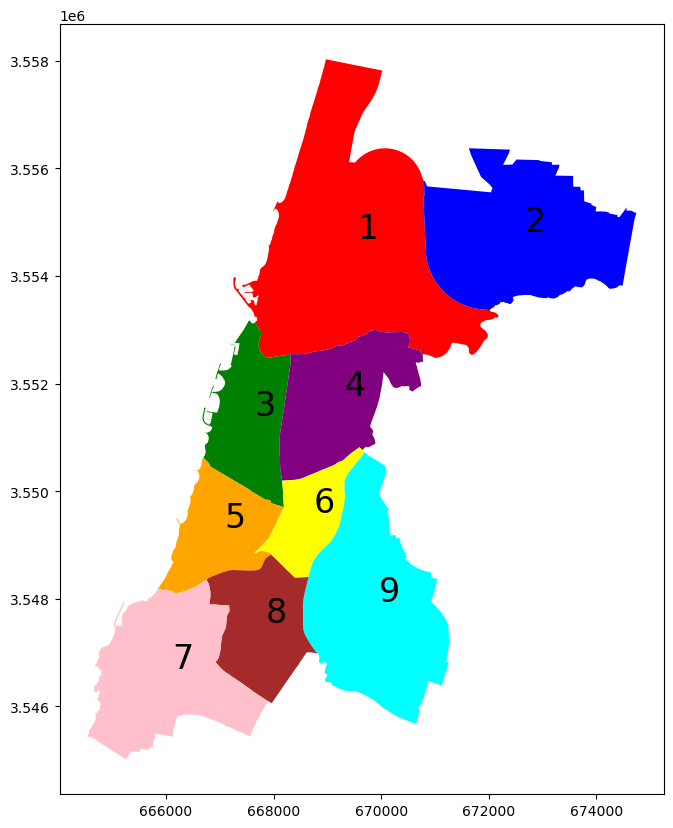

In [3]:
ta_q['index'] = ta_q.index

# Define a list of colors
color_map = {
    1: 'red', 2: 'blue', 3: 'green', 4: 'purple',
    5: 'orange', 6: 'yellow', 7: 'pink', 8: 'brown', 9: 'cyan'
}

# Basic plotting
fig, ax = plt.subplots(figsize=(10, 10))

# Plot each shape with a different color from the list
for idx, row in ta_q.iterrows():
    color = color_map[row['krova']]  # Cycle through the colors list
    gpd.GeoSeries([row['geometry']]).plot(ax=ax, color=color)

    # Get the centroid of the polygon to place the text
    centroid = row['geometry'].centroid
    ax.annotate(text=row['krova'], xy=(centroid.x, centroid.y), 
                xytext=(3, 3), textcoords="offset points",
                fontsize=24, color='black')

plt.show()

In [4]:
# Exclude micro mobility
BICYCLE = 15
SCOOTER = 21
E_BICYCLE = 23
micro_m = [SCOOTER, E_BICYCLE, BICYCLE]


In [5]:
# Load original accident data
i_m_h_ta_gdf = gpd.read_parquet('./csv_tables/i_m_h_ta_gdf.parquet')

In [6]:
# Accidents that are not MM
i_m_h_ta_no_mm_gdf = i_m_h_ta_gdf[~(i_m_h_ta_gdf.involve_vehicle_type.isin(micro_m))].copy()

In [7]:
# Accidents that are just MM
i_m_h_ta_mm_gdf =  gpd.read_parquet('./csv_tables/i_m_h_ta_mm_gdf.parquet')
display(i_m_h_ta_mm_gdf.crs)
i_m_h_ta_mm_gdf.head(5)

<Projected CRS: EPSG:32636>
Name: WGS 84 / UTM zone 36N
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: Between 30°E and 36°E, northern hemisphere between equator and 84°N, onshore and offshore. Belarus. Cyprus. Egypt. Ethiopia. Finland. Israel. Jordan. Kenya. Lebanon. Moldova. Norway. Russian Federation. Saudi Arabia. Sudan. Syria. Türkiye (Turkey). Uganda. Ukraine.
- bounds: (30.0, 0.0, 36.0, 84.0)
Coordinate Operation:
- name: UTM zone 36N
- method: Transverse Mercator
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

,accident_id,provider_and_id,provider_code,file_type_police,involved_type,involved_type_hebrew,license_acquiring_date,age_group,age_group_hebrew,sex,...,vehicle_attribution,vehicle_attribution_hebrew,seats,total_weight,total_weight_hebrew,vehicle_damage,vehicle_damage_hebrew,urban_intersection,accident_date,geometry
41,2013001368,32013001368,3,3,2,נהג נפגע,0,6,25-29,1,...,1.0,ישראלי,99.0,0.0,לא ידוע,4.0,אין נזק,NaN,2013-07-27 01:00:00,POINT (667544.749 3549959.961)
50,2013001742,32013001742,3,3,2,נהג נפגע,0,7,30-34,2,...,1.0,ישראלי,99.0,0.0,לא ידוע,4.0,אין נזק,NaN,2013-10-07 01:30:00,POINT (667286.918 3548726.540)
131,2013001350,12013001350,1,1,2,נהג נפגע,0,5,20-24,1,...,1.0,ישראלי,99.0,0.0,לא ידוע,4.0,אין נזק,NaN,2013-08-25 01:00:00,POINT (667023.688 3548785.170)
196,2013000147,12013000147,1,1,2,נהג נפגע,0,8,35-39,1,...,1.0,ישראלי,99.0,0.0,לא ידוע,2.0,בינוני,9110323.0,2013-09-19 00:00:00,POINT (668158.751 3551284.678)
197,2013000147,12013000147,1,1,2,נהג נפגע,0,6,25-29,1,...,1.0,ישראלי,99.0,0.0,לא ידוע,2.0,בינוני,9110323.0,2013-09-19 00:00:00,POINT (668158.751 3551284.678)


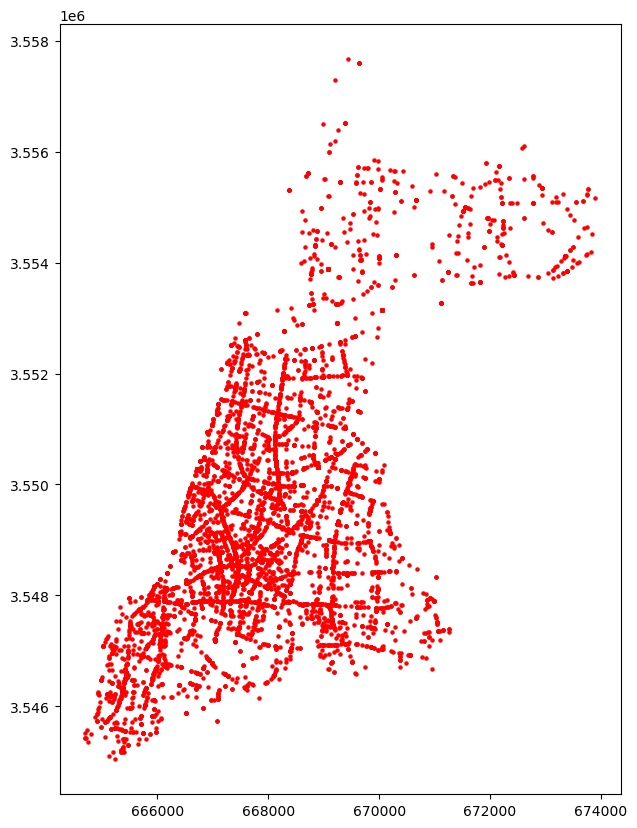

In [8]:
fig, ax = plt.subplots(figsize=(10, 10))
i_m_h_ta_mm_gdf.plot(ax=ax, color='red', marker='o', markersize=5 )
plt.show()

In [9]:
bp_ta_bp_and_meta = gpd.read_parquet('./csv_tables/bp_ta_bp_and_meta.parquet')
bp_ta_bp_and_meta.head(5)

,oid_shvil,msorech,dateimport,create_year,shemmikta,create_date,geometry,width,direction,bitzua,miflas,date_created
0,1,95.10,14/08/2024 02:30:05,2012,נמיר מיוניצ'מן דרומה,None,"LINESTRING (669823.985 3557373.860, 669855.549...",2.5,דו סטרי,2012,None,None
1,2,201.14,14/08/2024 02:30:05,2013,פרופס מנמיר עד קדושי השואה,None,"LINESTRING (669232.834 3555478.027, 669169.381...",2.5,דו סטרי,2013,None,None
2,3,696.31,14/08/2024 02:30:05,2004,יאיר רוזנבלום מאורי צבי גרינברג עד פרופס,None,"LINESTRING (669232.637 3555478.023, 669249.025...",2.1,דו סטרי,2004,None,None
3,4,659.20,14/08/2024 02:30:05,2018,"קק""ל מנמיר עד חיים לבנון",None,"LINESTRING (669354.261 3555417.055, 669410.178...",2.5,דו סטרי,2018,מדרכה,None
4,5,362.67,14/08/2024 02:30:05,2018,רקנאטי בגינה מקרן קיימת לישראל עד אחימאיר,None,"LINESTRING (669946.350 3555344.516, 669962.261...",2.0,דו סטרי,2018,None,30/06/2018


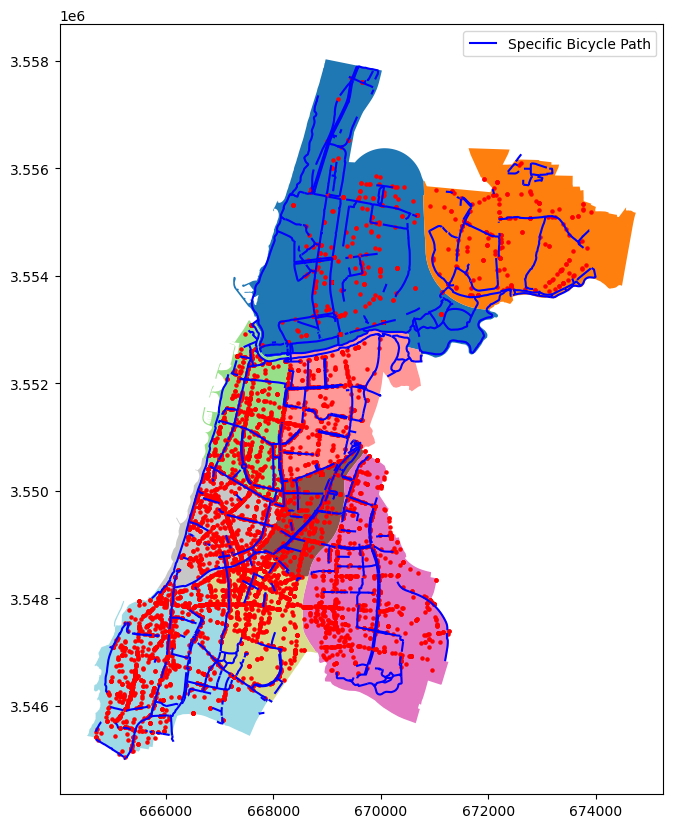

In [10]:
fig, ax = plt.subplots(figsize=(10, 10))

ta_q.plot(ax=ax, cmap='tab20', legend=True,)
bp_ta_bp_and_meta.plot(ax=ax, color='blue', label='Specific Bicycle Path')
i_m_h_ta_mm_gdf.plot(ax=ax, color='red', marker='o', markersize=5 )

plt.legend()
plt.show()

In [11]:
ta_streets = gpd.read_file('./csv_tables/TA_streets_20240724_031704/Streets.shp')
ta_streets

,oidrechov,krechov,trechov,shemangli,mslamas,tsug,kkivun,UniqueId,shemarvit,kreka,geometry
0,1.0,915.0,הרוגי מלכות,HARUGEY MALKHOT,336.0,רחוב,0.0,507-10001,قتل مملكة,100.0,"LINESTRING (672865.880 3554095.253, 672895.216..."
1,2.0,0.0,0,UKNOWN,0.0,רחוב,3.0,507-10002,None,100.0,"LINESTRING (666990.498 3551436.940, 667065.337..."
2,3.0,265.0,אמסטרדם,AMSTERDAM,516.0,רחוב,1.0,507-10003,أمستردام,100.0,"LINESTRING (667879.712 3551424.162, 667940.741..."
3,4.0,644.0,אלון יגאל,YIG'AL ALLON,2524.0,רחוב,0.0,507-10004,ألون ييغال,200.0,"LINESTRING (669570.036 3550420.535, 669581.404..."
4,5.0,634.0,מרגולין,MARGOLIN,2649.0,רחוב,1.0,507-10005,مارغولين,100.0,"LINESTRING (669329.153 3548322.758, 669409.403..."
...,...,...,...,...,...,...,...,...,...,...,...
8874,9851.0,3007.0,שבטי ישראל,SHIVTEY YISRA'EL,1983.0,רחוב,0.0,507-17843,قبائل إسرائيل,100.0,"LINESTRING (665771.816 3547023.159, 665760.256..."
8875,9852.0,3058.0,אבינרי יצחק,AVINERY,2027.0,רחוב,0.0,507-20562,Avinri Yitzhak,100.0,"LINESTRING (665585.719 3547178.152, 665627.936..."
8876,9853.0,3058.0,אבינרי יצחק,AVINERY,2027.0,רחוב,0.0,507-20563,Avinri Yitzhak,100.0,"LINESTRING (665700.142 3547064.296, 665759.119..."
8877,9855.0,3907.0,3907,None,1703.0,רחוב,0.0,507-21960,3907,100.0,"LINESTRING (665087.059 3546677.092, 665075.120..."


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


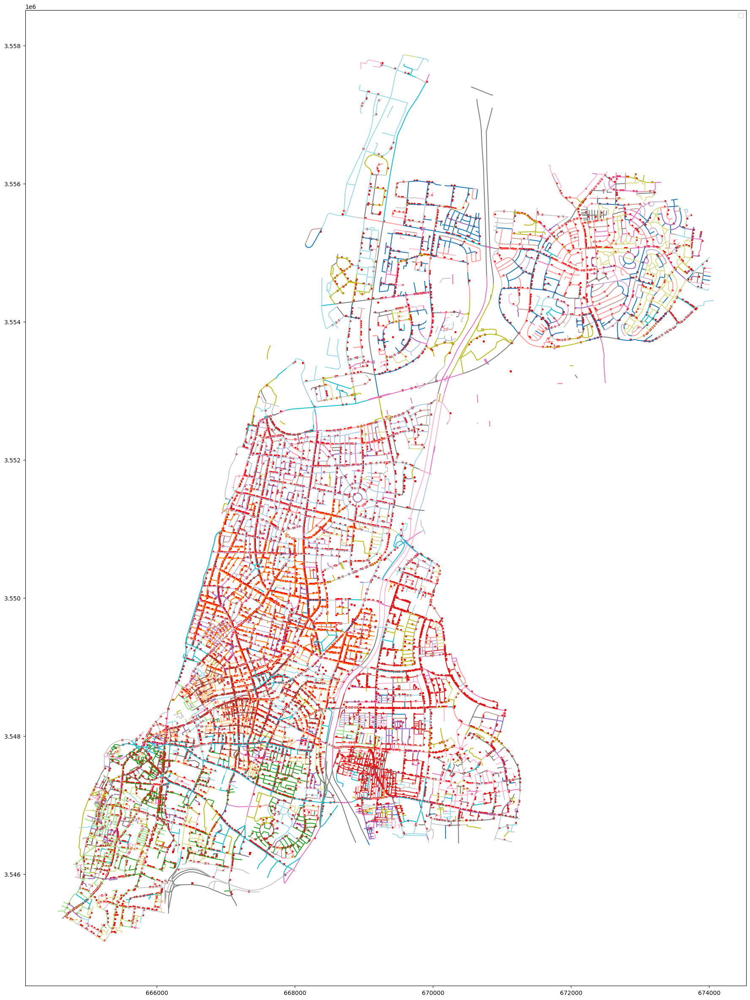

In [12]:

fig, ax = plt.subplots(figsize=(30, 30))
i_m_h_ta_gdf.plot(ax=ax, color='red', marker='o', markersize=5 )
ta_streets.plot(ax=ax, cmap='tab20')
plt.legend()
plt.show()

### Creating Crossroad data

#### Loading crosswalk data:

In [13]:
from shapely.ops import unary_union

In [14]:
# Loading and checking CRS

ta_crossroads = gpd.read_file('./../../Downloads/811/811/811.shp')
print(ta_crossroads.crs)

ta_crossroads = ta_crossroads.to_crs('32636')

ta_crossroads_ = ta_crossroads.copy()
print(ta_crossroads_.crs)

print('shape',ta_crossroads_.shape)

EPSG:2039
EPSG:32636
shape (7637, 11)


In [15]:
ta_crossroads_.head()

,traffic_si,traffic__1,traffic_su,last_updat,status_dat,survey_dat,date_impor,Shape_Leng,subject_ch,Descriptio,geometry
0,2040439,811,9.735025,2017-10-01,2017-09-28,2017-09-15,15/05/2024 02:28:24,30.000006,None,מעבר חציה להולכי רגל,"MULTILINESTRING ((669691.050 3557664.775, 6696..."
1,2031701,811,6.523980,2017-10-15,2017-10-04,2017-09-25,15/05/2024 02:28:24,20.999978,None,מעבר חציה להולכי רגל,"MULTILINESTRING ((670184.042 3553411.660, 6701..."
2,2012851,811,3.832506,2017-10-15,2017-10-04,2017-09-20,15/05/2024 02:28:24,12.000106,None,מעבר חציה להולכי רגל,"MULTILINESTRING ((669406.291 3552768.178, 6694..."
3,2009209,811,4.218764,2018-03-06,2017-08-31,2017-08-02,15/05/2024 02:28:24,15.000033,None,מעבר חציה להולכי רגל,"MULTILINESTRING ((669634.554 3555705.217, 6696..."
4,1076995,811,6.469185,2019-01-13,2019-01-10,2019-01-03,15/05/2024 02:28:24,21.000049,None,מעבר חציה להולכי רגל,"MULTILINESTRING ((665268.696 3545605.810, 6652..."


Plotting Crosswalks

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


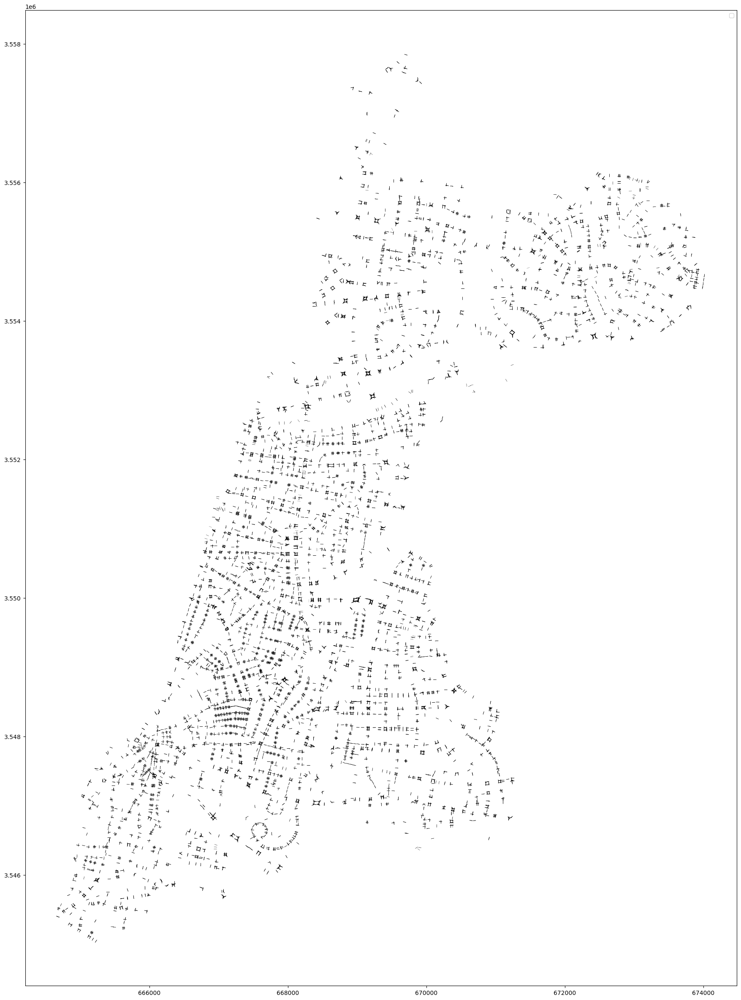

In [16]:
fig, ax = plt.subplots(figsize=(30, 30))
ta_crossroads_.plot(ax=ax, color='black', linewidth=5, alpha=0.5)

plt.legend()
plt.show()

Plotting specific crosswalks that I found in later exploration.

1065, 1058, 1430, 1709, 962, 1464, 874, 1384, 685, 965

In [17]:
specific_crosswalks = [1065]

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


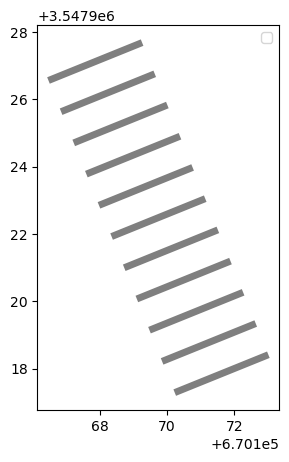

In [18]:
fig, ax = plt.subplots(figsize=(5, 5))
ta_crossroads[ta_crossroads.index.isin(specific_crosswalks)].plot(ax=ax, color='black', linewidth=5, alpha=0.5)

plt.legend()
plt.show()

Converting multi string crosswalk to a polygon and then combining different crosswalks that are at proximity to become a single polygon hence a crossroad

In [19]:
# Buffer each geometry and create convex hull if needed
ta_crossroads_['geometry'] = ta_crossroads_.geometry.convex_hull.buffer(10)  # Adjust buffer size

# Combine all geometries into a single multipolygon with merged overlaps
# This step will merge any overlapping polygons into a single geometry
merged_geometry = unary_union(ta_crossroads_.geometry)

# If you want each connected component as a separate polygon, convert the multipolygon back to individual polygons
crossroads_poly = gpd.GeoDataFrame(geometry=[merged_geometry], crs=ta_crossroads_.crs)

# Explode into individual polygons if merged into a MultiPolygon
crossroads_poly = crossroads_poly.explode(index_parts=True).reset_index(drop=True)

In [20]:
gpd.GeoDataFrame(geometry=[merged_geometry], crs=ta_crossroads_.crs)

,geometry
0,"MULTIPOLYGON (((665236.305 3545032.614, 665235..."


In [21]:
crossroads_poly

,geometry
0,"POLYGON ((665236.305 3545032.614, 665235.706 3..."
1,"POLYGON ((665191.334 3545061.628, 665190.763 3..."
2,"POLYGON ((665152.023 3545087.512, 665151.480 3..."
3,"POLYGON ((665169.380 3545149.282, 665169.097 3..."
4,"POLYGON ((665005.047 3545179.336, 665004.391 3..."
...,...
2909,"POLYGON ((666639.398 3549715.946, 666638.841 3..."
2910,"POLYGON ((667951.101 3549721.718, 667950.866 3..."
2911,"POLYGON ((668095.419 3549718.909, 668095.180 3..."
2912,"POLYGON ((667358.461 3549733.296, 667357.698 3..."


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


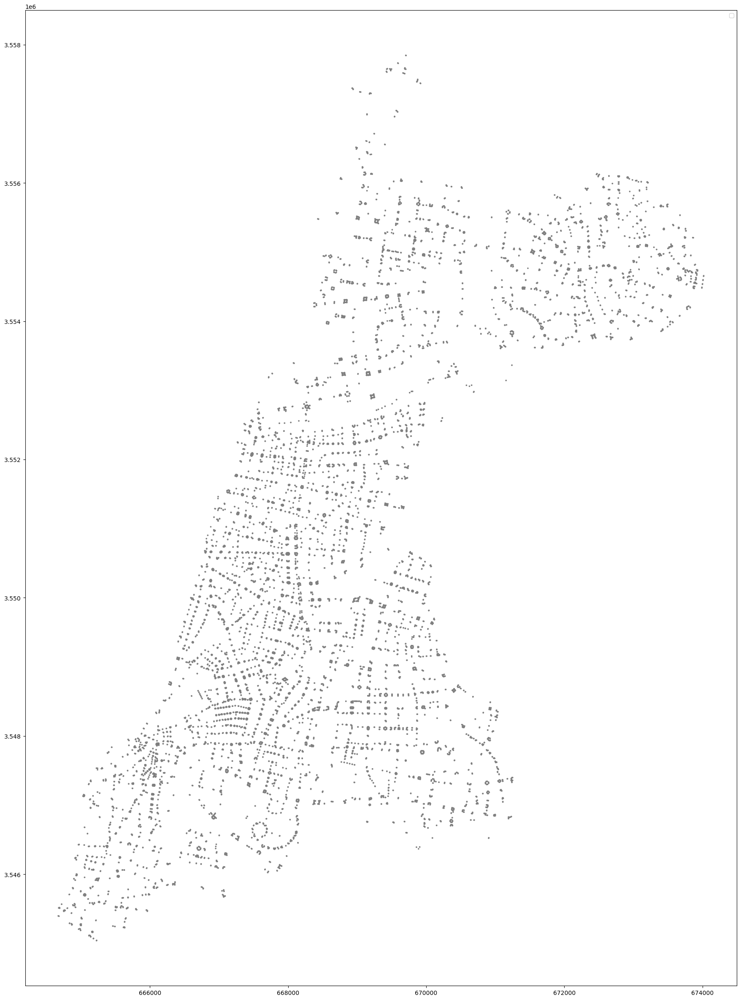

In [22]:
fig, ax = plt.subplots(figsize=(30, 30))
crossroads_poly.plot(ax=ax, color='black', linewidth=5, alpha=0.5)

plt.legend()
plt.show()

Plotting the specific crosswalk after preforming the conversion.

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


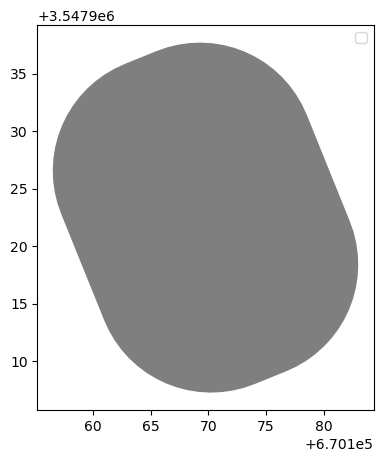

In [23]:
fig, ax = plt.subplots(figsize=(5, 5))
ta_crossroads_[ta_crossroads_.index.isin(specific_crosswalks)].plot(ax=ax, color='black', linewidth=5, alpha=0.5)

plt.legend()
plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


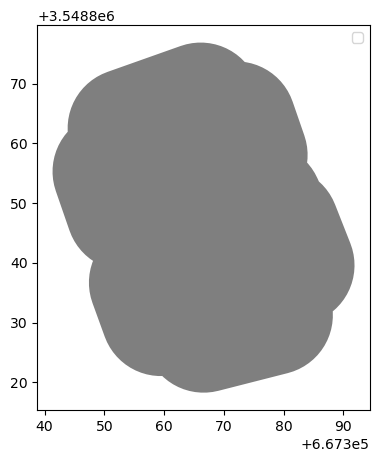

In [24]:
fig, ax = plt.subplots(figsize=(5, 5))
crossroads_poly[crossroads_poly.index.isin(specific_crosswalks)].plot(ax=ax, color='black', linewidth=5, alpha=0.5)

plt.legend()
plt.show()

#### Get the accidents that intersect the crosswalks

In [25]:
i_m_h_ta_mm_gdf.shape

(8789, 162)

Removing participants in the same accidents so we don't have more accidents.

Later we will analyze all participants when we want to check severity.

In [26]:
i_m_h_ta_mm_gdf_ = i_m_h_ta_mm_gdf.drop_duplicates(subset=['provider_and_id'])
i_m_h_ta_mm_gdf_ = i_m_h_ta_mm_gdf_[i_m_h_ta_mm_gdf_.location_accuracy == 1]

i_m_h_ta_mm_gdf_.shape

(4997, 162)

Getting the accidents that intersect our created crossroads.

In [27]:
i_m_h_ta_mm_crossroads_gdf = gpd.sjoin(i_m_h_ta_mm_gdf_, crossroads_poly, how='inner', predicate='intersects')

In [28]:
i_m_h_ta_mm_crossroads_gdf_ = i_m_h_ta_mm_crossroads_gdf.drop_duplicates(subset=['provider_and_id'])
i_m_h_ta_mm_crossroads_gdf_

,accident_id,provider_and_id,provider_code,file_type_police,involved_type,involved_type_hebrew,license_acquiring_date,age_group,age_group_hebrew,sex,...,vehicle_attribution_hebrew,seats,total_weight,total_weight_hebrew,vehicle_damage,vehicle_damage_hebrew,urban_intersection,accident_date,geometry,index_right
196,2013000147,12013000147,1,1,2,נהג נפגע,0,8,35-39,1,...,ישראלי,99.0,0.0,לא ידוע,2.0,בינוני,9110323.0,2013-09-19 00:00:00,POINT (668158.751 3551284.678),1810
251,2013001755,32013001755,3,3,2,נהג נפגע,2005,6,25-29,1,...,ישראלי,99.0,0.0,לא ידוע,4.0,אין נזק,11670545.0,2013-11-23 01:30:00,POINT (667291.113 3549059.667),1139
257,2013002105,32013002105,3,3,1,נהג,0,7,30-34,1,...,ישראלי,99.0,0.0,לא ידוע,1.0,קל,7540321.0,2013-01-01 02:15:00,POINT (667511.178 3551455.462),1913
349,2013001346,32013001346,3,3,2,נהג נפגע,0,5,20-24,2,...,ישראלי,99.0,0.0,לא ידוע,4.0,אין נזק,10335.0,2013-09-06 01:00:00,POINT (666916.964 3550924.250),1717
455,2013002036,12013002036,1,1,2,נהג נפגע,0,6,25-29,2,...,ישראלי,99.0,0.0,לא ידוע,4.0,אין נזק,7190312.0,2013-07-25 02:00:00,POINT (667485.202 3552090.010),2007
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
111269,2024098273,32024098273,3,3,2,נהג נפגע,1980,13,60-64,1,...,ישראלי,99.0,0.0,לא ידוע,1.0,קל,15270924.0,2024-03-31 08:00:00,POINT (669166.347 3548129.856),772
111326,2024098833,32024098833,3,3,1,נהג,0,99,לא ידוע,0,...,ישראלי,99.0,0.0,לא ידוע,4.0,אין נזק,NaN,2024-02-11 09:30:00,POINT (669401.673 3548849.759),1066
111332,2024090432,12024090432,1,1,2,נהג נפגע,1996,10,45-49,2,...,ישראלי,99.0,0.0,לא ידוע,1.0,קל,53040001.0,2024-04-01 19:30:00,POINT (667267.575 3546539.876),173
111345,2024096932,32024096932,3,3,2,נהג נפגע,2023,4,15-19,1,...,ישראלי,99.0,0.0,לא ידוע,4.0,אין נזק,NaN,2024-02-07 18:45:00,POINT (668119.593 3549579.660),1325


In [29]:
i_m_h_ta_mm_crossroads_gdf_.value_counts(subset='index_right')

index_right
1065    32
1058    30
1430    21
1709    19
962     18
        ..
1201     1
1196     1
1193     1
1192     1
0        1
Name: count, Length: 749, dtype: int64

### Creating crossroad name

I have tried using i_m_h_ta_mm_crossroads_gdf street1_hebrew and street2_hebrew to create the crossroad name.<br>
But there are cases where there is only 1 street1_hebrew and nan street2_hebrew so the result is nan<br>
OR there are several streets connecting and each accidents has a different street1_hebrew name 4 times for the same crossroad.

Will try to get the name by sjoin on ta_streets.

In [30]:
crossroads_poly

,geometry
0,"POLYGON ((665236.305 3545032.614, 665235.706 3..."
1,"POLYGON ((665191.334 3545061.628, 665190.763 3..."
2,"POLYGON ((665152.023 3545087.512, 665151.480 3..."
3,"POLYGON ((665169.380 3545149.282, 665169.097 3..."
4,"POLYGON ((665005.047 3545179.336, 665004.391 3..."
...,...
2909,"POLYGON ((666639.398 3549715.946, 666638.841 3..."
2910,"POLYGON ((667951.101 3549721.718, 667950.866 3..."
2911,"POLYGON ((668095.419 3549718.909, 668095.180 3..."
2912,"POLYGON ((667358.461 3549733.296, 667357.698 3..."


In [31]:
ta_streets

,oidrechov,krechov,trechov,shemangli,mslamas,tsug,kkivun,UniqueId,shemarvit,kreka,geometry
0,1.0,915.0,הרוגי מלכות,HARUGEY MALKHOT,336.0,רחוב,0.0,507-10001,قتل مملكة,100.0,"LINESTRING (672865.880 3554095.253, 672895.216..."
1,2.0,0.0,0,UKNOWN,0.0,רחוב,3.0,507-10002,None,100.0,"LINESTRING (666990.498 3551436.940, 667065.337..."
2,3.0,265.0,אמסטרדם,AMSTERDAM,516.0,רחוב,1.0,507-10003,أمستردام,100.0,"LINESTRING (667879.712 3551424.162, 667940.741..."
3,4.0,644.0,אלון יגאל,YIG'AL ALLON,2524.0,רחוב,0.0,507-10004,ألون ييغال,200.0,"LINESTRING (669570.036 3550420.535, 669581.404..."
4,5.0,634.0,מרגולין,MARGOLIN,2649.0,רחוב,1.0,507-10005,مارغولين,100.0,"LINESTRING (669329.153 3548322.758, 669409.403..."
...,...,...,...,...,...,...,...,...,...,...,...
8874,9851.0,3007.0,שבטי ישראל,SHIVTEY YISRA'EL,1983.0,רחוב,0.0,507-17843,قبائل إسرائيل,100.0,"LINESTRING (665771.816 3547023.159, 665760.256..."
8875,9852.0,3058.0,אבינרי יצחק,AVINERY,2027.0,רחוב,0.0,507-20562,Avinri Yitzhak,100.0,"LINESTRING (665585.719 3547178.152, 665627.936..."
8876,9853.0,3058.0,אבינרי יצחק,AVINERY,2027.0,רחוב,0.0,507-20563,Avinri Yitzhak,100.0,"LINESTRING (665700.142 3547064.296, 665759.119..."
8877,9855.0,3907.0,3907,None,1703.0,רחוב,0.0,507-21960,3907,100.0,"LINESTRING (665087.059 3546677.092, 665075.120..."


In [32]:
crossroads_poly

,geometry
0,"POLYGON ((665236.305 3545032.614, 665235.706 3..."
1,"POLYGON ((665191.334 3545061.628, 665190.763 3..."
2,"POLYGON ((665152.023 3545087.512, 665151.480 3..."
3,"POLYGON ((665169.380 3545149.282, 665169.097 3..."
4,"POLYGON ((665005.047 3545179.336, 665004.391 3..."
...,...
2909,"POLYGON ((666639.398 3549715.946, 666638.841 3..."
2910,"POLYGON ((667951.101 3549721.718, 667950.866 3..."
2911,"POLYGON ((668095.419 3549718.909, 668095.180 3..."
2912,"POLYGON ((667358.461 3549733.296, 667357.698 3..."


In [33]:
crossroads_index = crossroads_poly.index
crossroads_index

RangeIndex(start=0, stop=2914, step=1)

In [34]:
ta_street_crossroads = gpd.sjoin(ta_streets,crossroads_poly)

# ta_street_crossroads = ta_street_crossroads.drop_duplicates('krechov')
# ta_street_crossroads

In [35]:
# checking discrepancy between crossroads_poly and ta_streets join

ta_street_crossroads.index_right.values

array([2344, 2353, 1841, ...,  312,  197,  832], dtype=int64)

In [36]:
# Convert RangeIndex to a set
range_set = set(crossroads_index)

# Convert the array to a set
array_set = set(ta_street_crossroads.index_right.values)

# Find the intersection
intersection = crossroads_index.intersection(array_set)

# Find the values in the RangeIndex that are not in the array
difference = crossroads_index.difference(array_set)

# Convert results to sorted lists if needed
intersection_list = sorted(intersection)
difference_list = sorted(difference)

# Print results
print("Intersection:", intersection_list)
print("Difference:", difference_list)

Intersection: [0, 1, 2, 3, 4, 5, 6, 7, 8, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 71, 72, 74, 75, 76, 77, 78, 79, 80, 81, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 128, 129, 130, 131, 132, 133, 135, 136, 138, 139, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230,

In [37]:
len(difference_list)

148

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


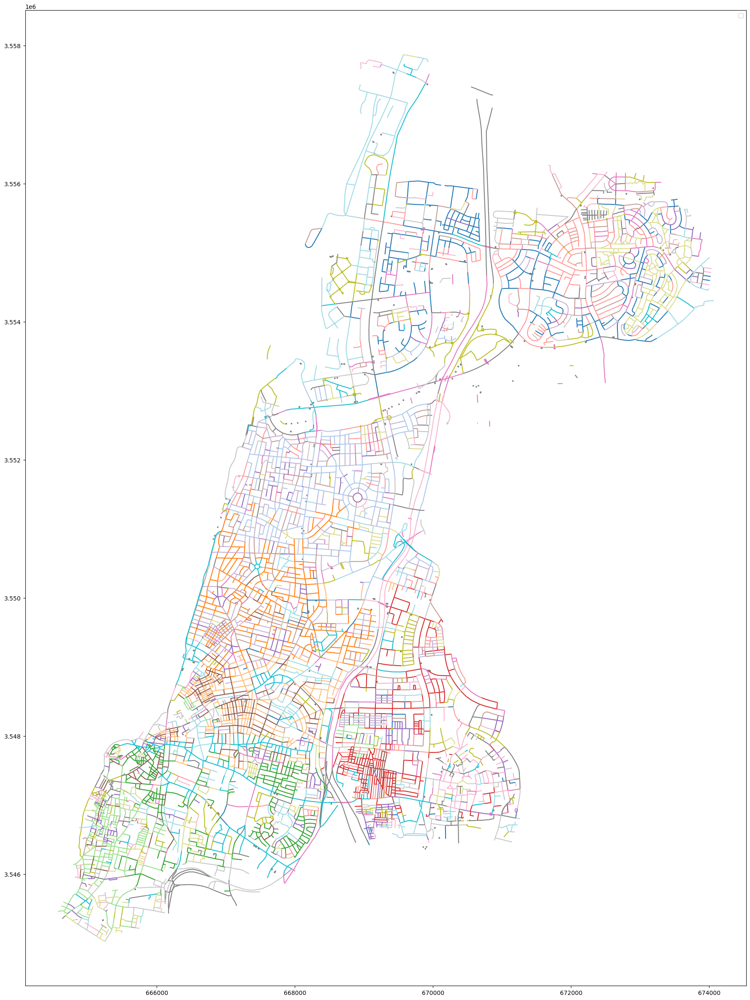

In [38]:
fig, ax = plt.subplots(figsize=(30, 30))
crossroads_poly[crossroads_poly.index.isin(difference_list)].plot(ax=ax, color='black', linewidth=5, alpha=0.5)
ta_streets.plot(ax=ax, cmap='tab20')

plt.legend()
plt.show()

In [39]:
ta_street_crossroads.index_right.value_counts()

index_right
2907    11
609      9
880      8
312      8
2689     8
        ..
2356     1
2343     1
2390     1
1059     1
1728     1
Name: count, Length: 2766, dtype: int64

In [40]:
ta_street_crossroads[ta_street_crossroads.index_right == 2907]

,oidrechov,krechov,trechov,shemangli,mslamas,tsug,kkivun,UniqueId,shemarvit,kreka,geometry,index_right
1199,1216.0,406.0,המלך ג'ורג',HA-MELEKH GEORGE,738.0,רחוב,0.0,507-11375,الملك جورج',200.0,"LINESTRING (667265.096 3549660.432, 667295.312...",2907
1200,1217.0,406.0,המלך ג'ורג',HA-MELEKH GEORGE,738.0,רחוב,0.0,507-11376,الملك جورج',200.0,"LINESTRING (667320.706 3549715.778, 667358.804...",2907
1201,1218.0,426.0,אלמונית,ALMONIT SIMTAT,1118.0,סמטת,0.0,507-11377,مجهول,50.0,"LINESTRING (667320.706 3549715.778, 667328.219...",2907
1202,1219.0,406.0,המלך ג'ורג',HA-MELEKH GEORGE,738.0,רחוב,0.0,507-11378,الملك جورج',200.0,"LINESTRING (667306.901 3549703.870, 667320.706...",2907
1203,1220.0,406.0,המלך ג'ורג',HA-MELEKH GEORGE,738.0,רחוב,0.0,507-11379,الملك جورج',200.0,"LINESTRING (667295.312 3549693.647, 667306.901...",2907
1204,1221.0,81.0,המכבי,HAMAKABI,1133.0,רחוב,1.0,507-11380,مكابي,100.0,"LINESTRING (667174.483 3549767.531, 667306.901...",2907
3708,3765.0,425.0,פלונית,PLONIT SIMTAT,1120.0,סמטת,0.0,507-14399,بيلي,50.0,"LINESTRING (667295.312 3549693.647, 667301.920...",2907
4013,4084.0,427.0,אלו מציאות,ELU METSIOT,1136.0,סמטת,1.0,507-14769,هذه حقيقة,50.0,"LINESTRING (667216.261 3549675.030, 667245.791...",2907
4379,4457.0,21.0,העבודה,HA'AVODA,1114.0,רחוב,2.0,507-15176,العمل,100.0,"LINESTRING (667265.096 3549660.432, 667414.948...",2907
4380,4458.0,406.0,המלך ג'ורג',HA-MELEKH GEORGE,738.0,רחוב,2.0,507-15177,الملك جورج',200.0,"LINESTRING (667245.791 3549646.192, 667265.096...",2907


In [41]:
# unique_counts = (
#     i_m_h_ta_mm_crossroads_gdf.groupby('index_right')
#     .agg(
#         unique_street1_hebrew=('street1_hebrew', lambda x: x.nunique(dropna=True)),
#         unique_street2_hebrew=('street2_hebrew', lambda x: x.nunique(dropna=True))
#     )
#     .reset_index()
# )

In [42]:
# u_c_street_for_crossroad = (ta_street_crossroads.groupby('index_right')
#                             .agg(num_unique_streets)
#                             )

Getting top 10 crossroad by accidents count.

In [43]:
t10_crossroad_id = i_m_h_ta_mm_crossroads_gdf.value_counts(subset='index_right').head(10).index
print(t10_crossroad_id)
i_m_h_ta_mm_crossroads_gdf_t10 = i_m_h_ta_mm_crossroads_gdf[i_m_h_ta_mm_crossroads_gdf.index_right.isin(t10_crossroad_id)]
i_m_h_ta_mm_crossroads_gdf_t10

Index([1065, 1058, 1430, 1709, 962, 1464, 874, 1384, 685, 965], dtype='int64', name='index_right')


,accident_id,provider_and_id,provider_code,file_type_police,involved_type,involved_type_hebrew,license_acquiring_date,age_group,age_group_hebrew,sex,...,vehicle_attribution_hebrew,seats,total_weight,total_weight_hebrew,vehicle_damage,vehicle_damage_hebrew,urban_intersection,accident_date,geometry,index_right
580,2013004110,12013004110,1,1,2,נהג נפגע,0,7,30-34,1,...,ישראלי,99.0,0.0,לא ידוע,1.0,קל,12280911.0,2013-04-24 06:30:00,POINT (669395.607 3549880.773),1430
2759,2013015911,12013015911,1,1,2,נהג נפגע,0,7,30-34,2,...,ישראלי,99.0,0.0,לא ידוע,1.0,קל,13320815.0,2013-04-22 09:45:00,POINT (667613.758 3547904.115),685
4865,2013024676,12013024676,1,1,1,נהג,0,7,30-34,1,...,ישראלי,99.0,0.0,לא ידוע,1.0,קל,12280911.0,2013-09-25 12:15:00,POINT (669395.607 3549880.773),1430
7642,2013037036,12013037036,1,1,1,נהג,0,9,40-44,1,...,ישראלי,99.0,0.0,לא ידוע,4.0,אין נזק,NaN,2013-02-25 15:30:00,POINT (667396.768 3548538.761),965
9775,2013043911,12013043911,1,1,2,נהג נפגע,2002,6,25-29,1,...,ישראלי,99.0,0.0,לא ידוע,1.0,קל,12950556.0,2013-07-04 16:45:00,POINT (667369.095 3548865.236),1065
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
109867,2024040748,12024040748,1,1,2,נהג נפגע,2008,7,30-34,1,...,ישראלי,99.0,0.0,לא ידוע,4.0,אין נזק,15130624.0,2024-01-08 12:00:00,POINT (668441.712 3548401.089),874
109917,2024041727,12024041727,1,1,2,נהג נפגע,1985,14,65-69,1,...,ישראלי,99.0,0.0,לא ידוע,4.0,אין נזק,13000556.0,2024-03-21 15:00:00,POINT (667463.789 3548538.130),962
109962,2024037537,32024037537,3,3,1,נהג,0,99,לא ידוע,0,...,ישראלי,99.0,0.0,לא ידוע,4.0,אין נזק,17730555.0,2024-01-14 17:45:00,POINT (667966.840 3548832.444),1058
110204,2024051752,32024051752,3,3,2,נהג נפגע,0,99,לא ידוע,0,...,ישראלי,99.0,0.0,לא ידוע,1.0,קל,17730555.0,2024-04-25 18:45:00,POINT (667966.840 3548832.444),1058


Creating crossroads name

C:\Users\itay8\AppData\Local\Temp\ipykernel_15096\4247611794.py:28: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  plt.legend()


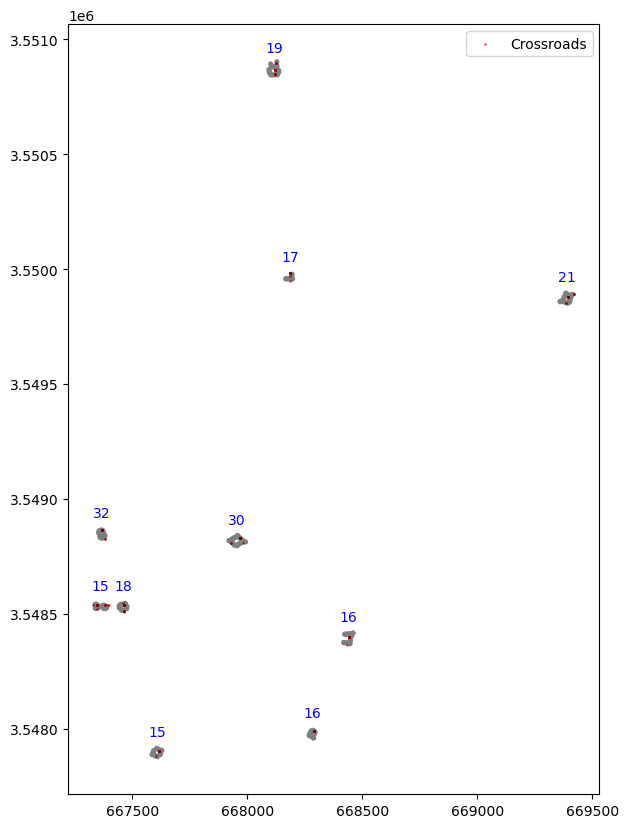

In [44]:
# Step 1: Get the count of `index_right`
v_counts_crossroad_idx = i_m_h_ta_mm_crossroads_gdf_.value_counts(subset='index_right')

# Step 2: Prepare the figure and axes
fig, ax = plt.subplots(figsize=(10, 10))

# Step 3: Plot points and polygons
# Plot the points
i_m_h_ta_mm_crossroads_gdf_t10.plot(
    ax=ax, color='red', marker='o', markersize=1, alpha=0.5, label="Crossroads"
)

# Plot the polygons with matching `index_right`
filtered_crossroads = crossroads_poly[crossroads_poly.index.isin(i_m_h_ta_mm_crossroads_gdf_t10.index_right)]
filtered_crossroads.plot(ax=ax, color='black', alpha=0.5, label="Polygons")

# Step 4: Annotate polygons with v_counts_crossroad_idx
for idx, row in filtered_crossroads.iterrows():
    count = v_counts_crossroad_idx.get(idx, 0)  # Get the count for this index; default to 0 if not found
    centroid = row.geometry.centroid  # Calculate the centroid of the polygon
    ax.text(
        centroid.x, centroid.y + 60,  # Add an offset to the y-coordinate
        str(count),  # The text to display
        fontsize=10, color="blue", ha='center', va='bottom', 
    )

# Step 5: Customize legend and show the plot
plt.legend()
plt.show()


Plotting top 10 crossroads by from 2013 - 2023 and number of accidents

Getting the top 10 crossroad_ index right by year



### Attempt 2 in creating the crossroads

Going over ta_streets and creating valid crossroads from the intersections between street parts.

In [45]:
# Import necessary libraries
from shapely.geometry import LineString
import geopandas as gpd

def split_linestrings_by_length(gdf, split_length=10):
    """Split each LineString in a GeoDataFrame into two LineStrings:
    one starting from the start point with the specified length
    and one ending at the endpoint with the specified length."""
    new_rows = []
    
    for i, row in gdf.iterrows():
        geometry = row.geometry
        
        # Check if the geometry is a LineString
        if isinstance(geometry, LineString):
            length = geometry.length
            
            # Ensure the split length is valid
            if split_length * 2 >= length:
                # If the split length exceeds the total length, skip splitting
                continue
            
            # Compute the two split points
            split_point_start = geometry.interpolate(split_length)
            split_point_end = geometry.interpolate(length - split_length)
            
            # Create two new LineStrings
            first_segment = LineString([geometry.coords[0], split_point_start.coords[0]])
            second_segment = LineString([split_point_end.coords[0], geometry.coords[-1]])
            # print('first half',first_segment.length, 'second_half', second_segment.length)
            
            # Append new rows with the original attributes and new geometries
            new_rows.append({**row.to_dict(), "geometry": first_segment})
            new_rows.append({**row.to_dict(), "geometry": second_segment})
    
    # Create a new GeoDataFrame with the split LineStrings
    return gpd.GeoDataFrame(new_rows, crs=gdf.crs)

# Example GeoDataFrame
data = {
    "id": [1, 2],
    "geometry": [
        LineString([(0, 0), (20, 0)]),
        LineString([(0, 0), (0, 30)]),
    ],
}
example_gdf = gpd.GeoDataFrame(data, crs="EPSG:4326")

# Split the LineStrings with a length of 10
split_gdf = split_linestrings_by_length(example_gdf, split_length=10)

# Display the resulting GeoDataFrame
# import ace_tools as tools; tools.display_dataframe_to_user(name="Split LineStrings by Length GeoDataFrame", dataframe=split_gdf)


(16960, 11)


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


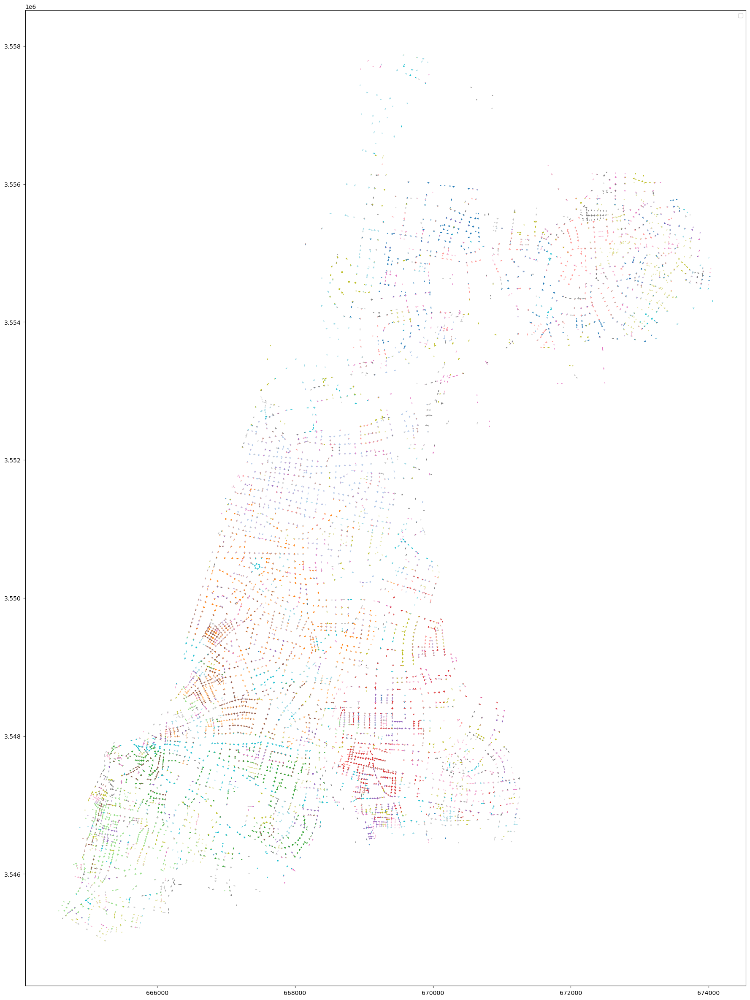

In [46]:
# Split the LineStrings in the example GeoDataFrame
ta_crossroads_from_streets = split_linestrings_by_length(ta_streets)
ta_crossroads_from_streets['geometry'] = ta_crossroads_from_streets.geometry.buffer(5)
print(ta_crossroads_from_streets.shape)

fig, ax = plt.subplots(figsize=(30, 30))
ta_crossroads_from_streets.plot(ax=ax, cmap='tab20')

plt.legend()
plt.show()

In [47]:
combined_polygons = ta_crossroads_from_streets.dissolve().explode()
print(combined_polygons.shape)


combined_polygons['geo_length'] = combined_polygons.geometry.length
combined_polygons = combined_polygons.reset_index().drop(columns=['level_1','level_0'])
combined_polygons

(5628, 11)


C:\Users\itay8\AppData\Local\Temp\ipykernel_15096\2278547393.py:1: FutureWarning: Currently, index_parts defaults to True, but in the future, it will default to False to be consistent with Pandas. Use `index_parts=True` to keep the current behavior and True/False to silence the warning.
  combined_polygons = ta_crossroads_from_streets.dissolve().explode()


,oidrechov,krechov,trechov,shemangli,mslamas,tsug,kkivun,UniqueId,shemarvit,kreka,geometry,geo_length
0,1.0,915.0,הרוגי מלכות,HARUGEY MALKHOT,336.0,רחוב,0.0,507-10001,قتل مملكة,100.0,"POLYGON ((665251.028 3545022.970, 665250.991 3...",69.100794
1,1.0,915.0,הרוגי מלכות,HARUGEY MALKHOT,336.0,רחוב,0.0,507-10001,قتل مملكة,100.0,"POLYGON ((665173.003 3545083.704, 665173.279 3...",51.403312
2,1.0,915.0,הרוגי מלכות,HARUGEY MALKHOT,336.0,רחוב,0.0,507-10001,قتل مملكة,100.0,"POLYGON ((665136.784 3545100.508, 665137.185 3...",87.109020
3,1.0,915.0,הרוגי מלכות,HARUGEY MALKHOT,336.0,רחוב,0.0,507-10001,قتل مملكة,100.0,"POLYGON ((665262.291 3545110.298, 665262.003 3...",51.390955
4,1.0,915.0,הרוגי מלכות,HARUGEY MALKHOT,336.0,רחוב,0.0,507-10001,قتل مملكة,100.0,"POLYGON ((665227.787 3545131.528, 665228.177 3...",82.956372
...,...,...,...,...,...,...,...,...,...,...,...,...
5623,1.0,915.0,הרוגי מלכות,HARUGEY MALKHOT,336.0,רחוב,0.0,507-10001,قتل مملكة,100.0,"POLYGON ((669845.350 3557772.019, 669845.346 3...",71.403332
5624,1.0,915.0,הרוגי מלכות,HARUGEY MALKHOT,336.0,רחוב,0.0,507-10001,قتل مملكة,100.0,"POLYGON ((669241.826 3557690.173, 669241.781 3...",71.138641
5625,1.0,915.0,הרוגי מלכות,HARUGEY MALKHOT,336.0,רחוב,0.0,507-10001,قتل مملكة,100.0,"POLYGON ((669140.042 3557704.879, 669140.522 3...",51.403312
5626,1.0,915.0,הרוגי מלכות,HARUGEY MALKHOT,336.0,רחוב,0.0,507-10001,قتل مملكة,100.0,"POLYGON ((669586.350 3557706.521, 669586.804 3...",69.133970


In [48]:
combined_polygons[combined_polygons.geo_length >300]


,oidrechov,krechov,trechov,shemangli,mslamas,tsug,kkivun,UniqueId,shemarvit,kreka,geometry,geo_length
394,1.0,915.0,הרוגי מלכות,HARUGEY MALKHOT,336.0,רחוב,0.0,507-10001,قتل مملكة,100.0,"POLYGON ((665220.022 3546437.888, 665219.901 3...",397.047146
441,1.0,915.0,הרוגי מלכות,HARUGEY MALKHOT,336.0,רחוב,0.0,507-10001,قتل مملكة,100.0,"POLYGON ((669087.116 3546513.295, 669087.600 3...",319.089798
600,1.0,915.0,הרוגי מלכות,HARUGEY MALKHOT,336.0,רחוב,0.0,507-10001,قتل مملكة,100.0,"POLYGON ((669320.048 3546684.341, 669320.034 3...",335.301705
660,1.0,915.0,הרוגי מלכות,HARUGEY MALKHOT,336.0,רחוב,0.0,507-10001,قتل مملكة,100.0,"POLYGON ((669343.979 3546738.237, 669343.987 3...",302.996312
733,1.0,915.0,הרוגי מלכות,HARUGEY MALKHOT,336.0,רחוב,0.0,507-10001,قتل مملكة,100.0,"POLYGON ((665208.254 3546799.085, 665208.125 3...",679.407809
792,1.0,915.0,הרוגי מלכות,HARUGEY MALKHOT,336.0,רחוב,0.0,507-10001,قتل مملكة,100.0,"POLYGON ((668994.554 3546855.911, 668994.799 3...",339.646468
797,1.0,915.0,הרוגי מלכות,HARUGEY MALKHOT,336.0,רחוב,0.0,507-10001,قتل مملكة,100.0,"POLYGON ((669046.092 3546865.995, 669046.582 3...",326.530708
881,1.0,915.0,הרוגי מלכות,HARUGEY MALKHOT,336.0,רחוב,0.0,507-10001,قتل مملكة,100.0,"POLYGON ((665142.336 3546949.298, 665142.108 3...",497.254696
891,1.0,915.0,הרוגי מלכות,HARUGEY MALKHOT,336.0,רחוב,0.0,507-10001,قتل مملكة,100.0,"POLYGON ((665218.068 3546957.509, 665217.819 3...",312.401531
978,1.0,915.0,הרוגי מלכות,HARUGEY MALKHOT,336.0,רחוב,0.0,507-10001,قتل مملكة,100.0,"POLYGON ((665150.577 3547047.155, 665150.971 3...",564.434988


In [49]:
combined_polygons.geo_length.max()

679.4078086770243

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


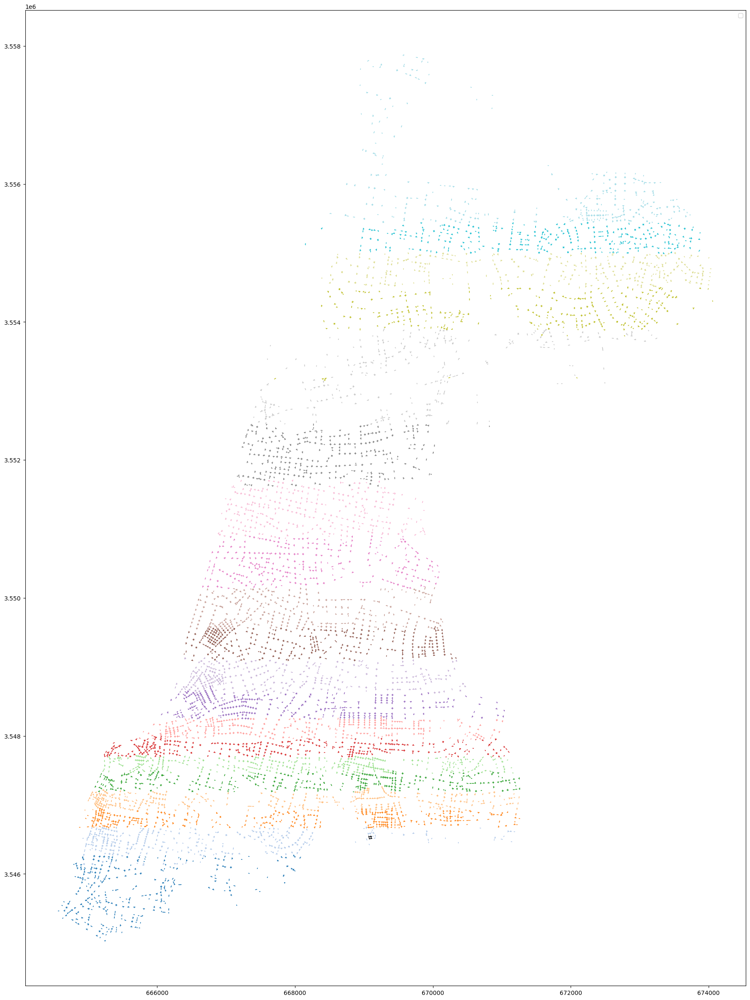

In [50]:
fig, ax = plt.subplots(figsize=(30, 30))
combined_polygons.plot(ax=ax, cmap='tab20')
combined_polygons[combined_polygons.index == 441].plot(ax=ax, color='black')

plt.legend()
plt.show()

In [51]:
joined = gpd.sjoin(ta_streets, combined_polygons[['geometry','geo_length']], how="inner", predicate="intersects")
# joined.groupby('index_right')['trechov']
joined

,oidrechov,krechov,trechov,shemangli,mslamas,tsug,kkivun,UniqueId,shemarvit,kreka,geometry,index_right,geo_length
0,1.0,915.0,הרוגי מלכות,HARUGEY MALKHOT,336.0,רחוב,0.0,507-10001,قتل مملكة,100.0,"LINESTRING (672865.880 3554095.253, 672895.216...",4603,87.905884
0,1.0,915.0,הרוגי מלכות,HARUGEY MALKHOT,336.0,רחוב,0.0,507-10001,قتل مملكة,100.0,"LINESTRING (672865.880 3554095.253, 672895.216...",4609,87.787937
1,2.0,0.0,0,UKNOWN,0.0,רחוב,3.0,507-10002,None,100.0,"LINESTRING (666990.498 3551436.940, 667065.337...",3858,86.827406
1,2.0,0.0,0,UKNOWN,0.0,רחוב,3.0,507-10002,None,100.0,"LINESTRING (666990.498 3551436.940, 667065.337...",3866,51.403312
2,3.0,265.0,אמסטרדם,AMSTERDAM,516.0,רחוב,1.0,507-10003,أمستردام,100.0,"LINESTRING (667879.712 3551424.162, 667940.741...",3853,102.748388
...,...,...,...,...,...,...,...,...,...,...,...,...,...
8876,9853.0,3058.0,אבינרי יצחק,AVINERY,2027.0,רחוב,0.0,507-20563,Avinri Yitzhak,100.0,"LINESTRING (665700.142 3547064.296, 665759.119...",1001,71.179821
8877,9855.0,3907.0,3907,None,1703.0,רחוב,0.0,507-21960,3907,100.0,"LINESTRING (665087.059 3546677.092, 665075.120...",580,51.403312
8877,9855.0,3907.0,3907,None,1703.0,רחוב,0.0,507-21960,3907,100.0,"LINESTRING (665087.059 3546677.092, 665075.120...",590,124.688742
8878,9857.0,34.0,מטלון,MATALON,2327.0,רחוב,0.0,507-21966,ميتالون,100.0,"LINESTRING (666917.433 3548291.622, 666930.486...",2294,51.403312


In [52]:
# import geopandas as gpd

def process_trechov_combination(ta_streets, combined_polygons):
    # Step 1: Perform a spatial join
    joined = gpd.sjoin(ta_streets, combined_polygons, how="inner", predicate="intersects")
    
    # Step 2: Group by index of combined_polygons and collect `trechov` names
    trechov_grouped = joined.groupby('index_right')['trechov'].apply(
        lambda trechovs: list(set(trechovs))  # Deduplicate `trechov` names
    )
    
    # Step 3: Add the combined `trechov` and count back to combined_polygons
    combined_polygons['combined_trechov'] = combined_polygons.index.map(trechov_grouped)
    combined_polygons['combined_trechov'] = combined_polygons['combined_trechov'].apply(
        lambda x: x if x is not None else []  # Handle polygons with no matches
    )
    
    # Step 4: Add the count of unique `trechov` names
    combined_polygons['num_trechov'] = combined_polygons['combined_trechov'].apply(len)
    
    return combined_polygons

# Example usage
resulting_combined_polygons = process_trechov_combination(ta_streets, combined_polygons[['geometry','geo_length']].copy())

# Display the updated GeoDataFrame
# import ace_tools as tools; tools.display_dataframe_to_user(name="Polygons with Combined Trechov Data", dataframe=resulting_combined_polygons)
resulting_combined_polygons

,geometry,geo_length,combined_trechov,num_trechov
0,"POLYGON ((665251.028 3545022.970, 665250.991 3...",69.100794,"[ירושלים, הולצברג שמחה]",2
1,"POLYGON ((665173.003 3545083.704, 665173.279 3...",51.403312,"[8186, הולצברג שמחה]",2
2,"POLYGON ((665136.784 3545100.508, 665137.185 3...",87.109020,"[קרוא ברוך, הולצברג שמחה]",2
3,"POLYGON ((665262.291 3545110.298, 665262.003 3...",51.390955,[8101],1
4,"POLYGON ((665227.787 3545131.528, 665228.177 3...",82.956372,"[8186, מייזל זלמן]",2
...,...,...,...,...
5623,"POLYGON ((669845.350 3557772.019, 669845.346 3...",71.403332,[2379],1
5624,"POLYGON ((669241.826 3557690.173, 669241.781 3...",71.138641,[2170],1
5625,"POLYGON ((669140.042 3557704.879, 669140.522 3...",51.403312,[2170],1
5626,"POLYGON ((669586.350 3557706.521, 669586.804 3...",69.133970,[זלצמן פנינה פרופ'],1


In [53]:
street_names = []
resulting_combined_polygons[resulting_combined_polygons.num_trechov == 1].combined_trechov.apply(lambda x: street_names.append(x[0]))
street_names

['8101',
 '3861',
 'ירושלים',
 '8101',
 '3861',
 '8101',
 'קהילת קנדה',
 'קהילת קנדה',
 'קרוא ברוך',
 'מייזל זלמן',
 'קרוא ברוך',
 'קרוא ברוך',
 'הולצברג שמחה',
 'חלמית',
 'חריף אייזיק',
 'חיננית',
 'גלעינית',
 'יפת',
 'חיננית',
 'ירושלים',
 'קהילת קנדה',
 'ירושלים',
 '3404',
 '3777',
 'יפת',
 'ירושלים',
 'מחרוזת',
 'יפת',
 '3198',
 '3777',
 '3408',
 'זכרון קדושים',
 'תל גבורים',
 '3407',
 'חריף אייזיק',
 '3777',
 'רובינשטין יצחק',
 '3822',
 'יטבת',
 'בת ים',
 'רובינשטין יצחק',
 '8179',
 '8178',
 'רובינשטין יצחק',
 '3933',
 'רובינשטין יצחק',
 'חריף אייזיק',
 '3777',
 'רובינשטין יצחק',
 'עירית',
 'רובינשטין יצחק',
 'יפת',
 '3941',
 'עירית',
 '3389',
 'פיקוס',
 'פיקוס',
 'ידין יגאל',
 'סומקן',
 'ירושלים',
 'שם הגדולים',
 'תל גבורים',
 '3777',
 'מנדלשטם אוסיפ',
 'ידין יגאל',
 'הלוחמים',
 'שם הגדולים',
 'שם הגדולים',
 'ידין יגאל',
 'חיל השריון',
 '3180',
 'באר שבע',
 'תל גבורים',
 '3850',
 'באר שבע',
 'ידין יגאל',
 'קדרון',
 'יפת',
 '3948',
 'קדרון',
 'ידין יגאל',
 'יפת',
 '3947',
 '3386',

Checking crossroads that have just one street, seeing if I can drop them

<Axes: >

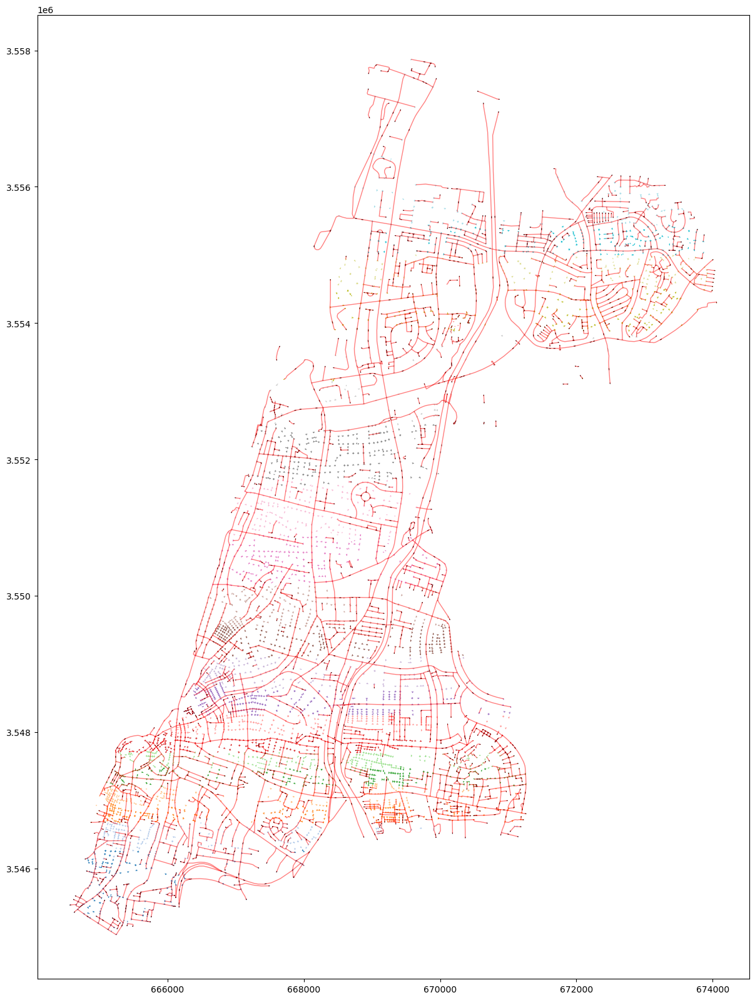

In [54]:
fig, ax = plt.subplots(figsize=(20,20))

# ta_streets[ta_streets.trechov == 'הולצברג שמחה'].plot(ax=ax, color='red')
ta_streets[ta_streets.trechov.isin(street_names)].plot(ax=ax, color='red',linewidth=1, alpha=0.5)

resulting_combined_polygons.plot(ax=ax, cmap='tab20')
# resulting_combined_polygons[resulting_combined_polygons.index == 0].plot(ax=ax, color='black')
resulting_combined_polygons[resulting_combined_polygons.num_trechov ==1].plot(ax=ax, color='black')

Seems OK to drop them

Checking crossroads with 3 street names

<Axes: >

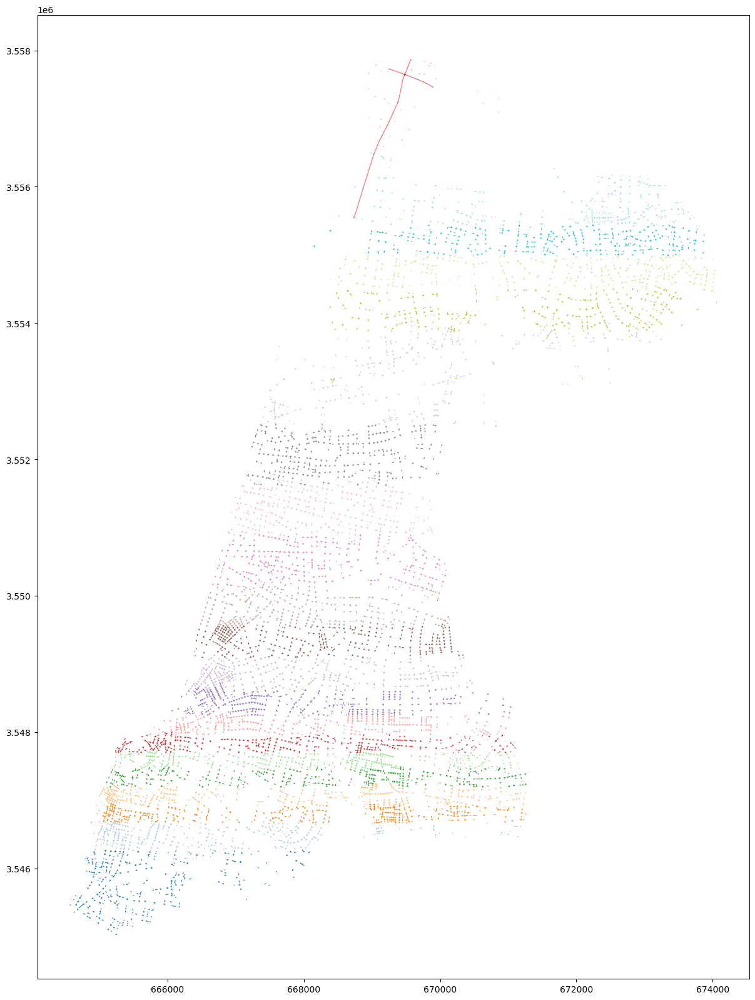

In [55]:

fig, ax = plt.subplots(figsize=(20,20))

# ta_streets[ta_streets.trechov == 'הולצברג שמחה'].plot(ax=ax, color='red')
ta_streets[ta_streets.trechov.isin(['2040', '2425',"יוניצ'מן" ])].plot(ax=ax, color='red',linewidth=1, alpha=0.5)

resulting_combined_polygons.plot(ax=ax, cmap='tab20')
# resulting_combined_polygons[resulting_combined_polygons.index == 0].plot(ax=ax, color='black')
# resulting_combined_polygons[resulting_combined_polygons.num_trechov ==1]
resulting_combined_polygons[resulting_combined_polygons.index == 5613].plot(ax=ax, color='black')


seems ok

In [56]:
crossroads = resulting_combined_polygons[resulting_combined_polygons.num_trechov > 1].copy()

crossroads

,geometry,geo_length,combined_trechov,num_trechov
0,"POLYGON ((665251.028 3545022.970, 665250.991 3...",69.100794,"[ירושלים, הולצברג שמחה]",2
1,"POLYGON ((665173.003 3545083.704, 665173.279 3...",51.403312,"[8186, הולצברג שמחה]",2
2,"POLYGON ((665136.784 3545100.508, 665137.185 3...",87.109020,"[קרוא ברוך, הולצברג שמחה]",2
4,"POLYGON ((665227.787 3545131.528, 665228.177 3...",82.956372,"[8186, מייזל זלמן]",2
9,"POLYGON ((665173.472 3545168.918, 665177.786 3...",102.784069,"[קרוא ברוך, מייזל זלמן]",2
...,...,...,...,...
5610,"POLYGON ((669682.957 3557574.183, 669683.404 3...",87.144049,"[זלצמן פנינה פרופ', יוניצ'מן]",2
5613,"POLYGON ((669487.620 3557650.166, 669492.204 3...",102.797975,"[2040, יוניצ'מן, 2425]",3
5614,"POLYGON ((669775.071 3557641.033, 669775.064 3...",70.348862,"[2379, זלצמן פנינה פרופ']",2
5617,"POLYGON ((669253.043 3557722.800, 669251.421 3...",87.105175,"[2170, יוניצ'מן]",2


In [57]:
crossroads_buff = crossroads.copy()
crossroads_buff['geometry'] = crossroads_buff.buffer(5)

In [58]:
crossroads_buff

,geometry,geo_length,combined_trechov,num_trechov
0,"POLYGON ((665241.737 3545016.900, 665241.737 3...",69.100794,"[ירושלים, הולצברג שמחה]",2
1,"POLYGON ((665168.735 3545086.310, 665168.868 3...",51.403312,"[8186, הולצברג שמחה]",2
2,"POLYGON ((665122.519 3545115.519, 665122.605 3...",87.109020,"[קרוא ברוך, הולצברג שמחה]",2
4,"POLYGON ((665214.302 3545122.601, 665214.204 3...",82.956372,"[8186, מייזל זלמן]",2
9,"POLYGON ((665152.897 3545164.236, 665152.758 3...",102.784069,"[קרוא ברוך, מייזל זלמן]",2
...,...,...,...,...
5610,"POLYGON ((669665.849 3557586.227, 669666.036 3...",87.144049,"[זלצמן פנינה פרופ', יוניצ'מן]",2
5613,"POLYGON ((669467.880 3557641.819, 669467.870 3...",102.797975,"[2040, יוניצ'מן, 2425]",3
5614,"POLYGON ((669779.355 3557638.456, 669779.332 3...",70.348862,"[2379, זלצמן פנינה פרופ']",2
5617,"POLYGON ((669256.145 3557716.441, 669256.064 3...",87.105175,"[2170, יוניצ'מן]",2


<Axes: >

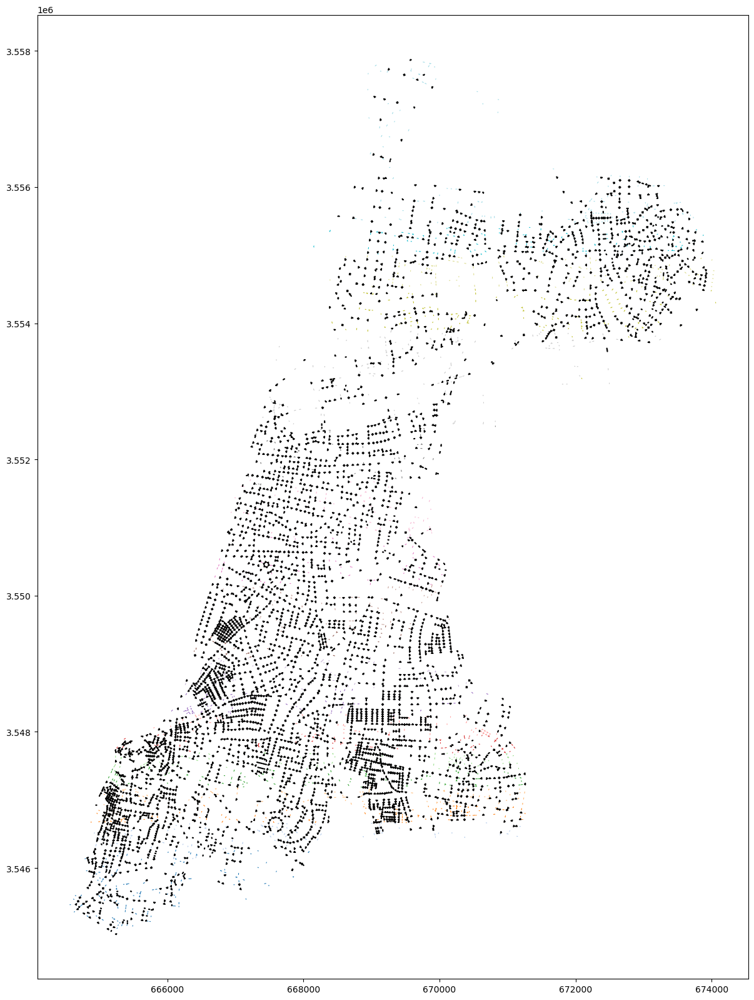

In [59]:

fig, ax = plt.subplots(figsize=(20,20))

# ta_streets[ta_streets.trechov == 'הולצברג שמחה'].plot(ax=ax, color='red')

resulting_combined_polygons.plot(ax=ax, cmap='tab20')
crossroads_buff.plot(ax=ax, color='black')


### NEXT: get all the accidents for each crossroad

In [60]:
i_m_h_ta_mm_acc_one_gdf = i_m_h_ta_mm_gdf[i_m_h_ta_mm_gdf.location_accuracy == 1 ].copy()
i_m_h_ta_mm_acc_one_gdf

,accident_id,provider_and_id,provider_code,file_type_police,involved_type,involved_type_hebrew,license_acquiring_date,age_group,age_group_hebrew,sex,...,vehicle_attribution,vehicle_attribution_hebrew,seats,total_weight,total_weight_hebrew,vehicle_damage,vehicle_damage_hebrew,urban_intersection,accident_date,geometry
131,2013001350,12013001350,1,1,2,נהג נפגע,0,5,20-24,1,...,1.0,ישראלי,99.0,0.0,לא ידוע,4.0,אין נזק,NaN,2013-08-25 01:00:00,POINT (667023.688 3548785.170)
196,2013000147,12013000147,1,1,2,נהג נפגע,0,8,35-39,1,...,1.0,ישראלי,99.0,0.0,לא ידוע,2.0,בינוני,9110323.0,2013-09-19 00:00:00,POINT (668158.751 3551284.678)
197,2013000147,12013000147,1,1,2,נהג נפגע,0,6,25-29,1,...,1.0,ישראלי,99.0,0.0,לא ידוע,2.0,בינוני,9110323.0,2013-09-19 00:00:00,POINT (668158.751 3551284.678)
251,2013001755,32013001755,3,3,2,נהג נפגע,2005,6,25-29,1,...,1.0,ישראלי,99.0,0.0,לא ידוע,4.0,אין נזק,11670545.0,2013-11-23 01:30:00,POINT (667291.113 3549059.667)
257,2013002105,32013002105,3,3,1,נהג,0,7,30-34,1,...,1.0,ישראלי,99.0,0.0,לא ידוע,1.0,קל,7540321.0,2013-01-01 02:15:00,POINT (667511.178 3551455.462)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
111332,2024090432,12024090432,1,1,2,נהג נפגע,1996,10,45-49,2,...,1.0,ישראלי,99.0,0.0,לא ידוע,1.0,קל,53040001.0,2024-04-01 19:30:00,POINT (667267.575 3546539.876)
111345,2024096932,32024096932,3,3,2,נהג נפגע,2023,4,15-19,1,...,1.0,ישראלי,99.0,0.0,לא ידוע,4.0,אין נזק,NaN,2024-02-07 18:45:00,POINT (668119.593 3549579.660)
111392,2024095225,32024095225,3,3,2,נהג נפגע,2019,5,20-24,1,...,1.0,ישראלי,99.0,0.0,לא ידוע,4.0,אין נזק,NaN,2024-03-15 09:30:00,POINT (666446.432 3548745.372)
111394,2024095204,32024095204,3,3,2,נהג נפגע,2013,7,30-34,1,...,1.0,ישראלי,99.0,0.0,לא ידוע,4.0,אין נזק,10960516.0,2024-05-05 14:00:00,POINT (667800.849 3549565.145)


Fixing *combined_trechov*

In [61]:
crossroads_buff['combined_trechov'] = crossroads_buff.combined_trechov.apply(lambda x: ','.join(x) )
crossroads_buff['combined_trechov']

0             ירושלים,הולצברג שמחה
1                8186,הולצברג שמחה
2           קרוא ברוך,הולצברג שמחה
4                  8186,מייזל זלמן
9             קרוא ברוך,מייזל זלמן
                   ...            
5610    זלצמן פנינה פרופ',יוניצ'מן
5613            2040,יוניצ'מן,2425
5614        2379,זלצמן פנינה פרופ'
5617                 2170,יוניצ'מן
5627                     2379,2425
Name: combined_trechov, Length: 4157, dtype: object

In [62]:
crossroads_buff.combined_trechov.value_counts().head(10)

combined_trechov
רבינא,רב אשי                       3
לבני איתן,0                        2
שוסטקוביץ' דמיטרי,אויסטרך דוד      2
גולי קניה,הגולן                    2
גורי ישראל,דשבסקי                  2
המדינה,הא באייר,ויצמן              2
שמגר,המצביאים                      2
כ.מוולפסון לצפון6200,חיל השריון    2
ראב"ד,שלמה                         2
ליוויק,אחרון יוסף                  2
Name: count, dtype: int64

<Axes: >

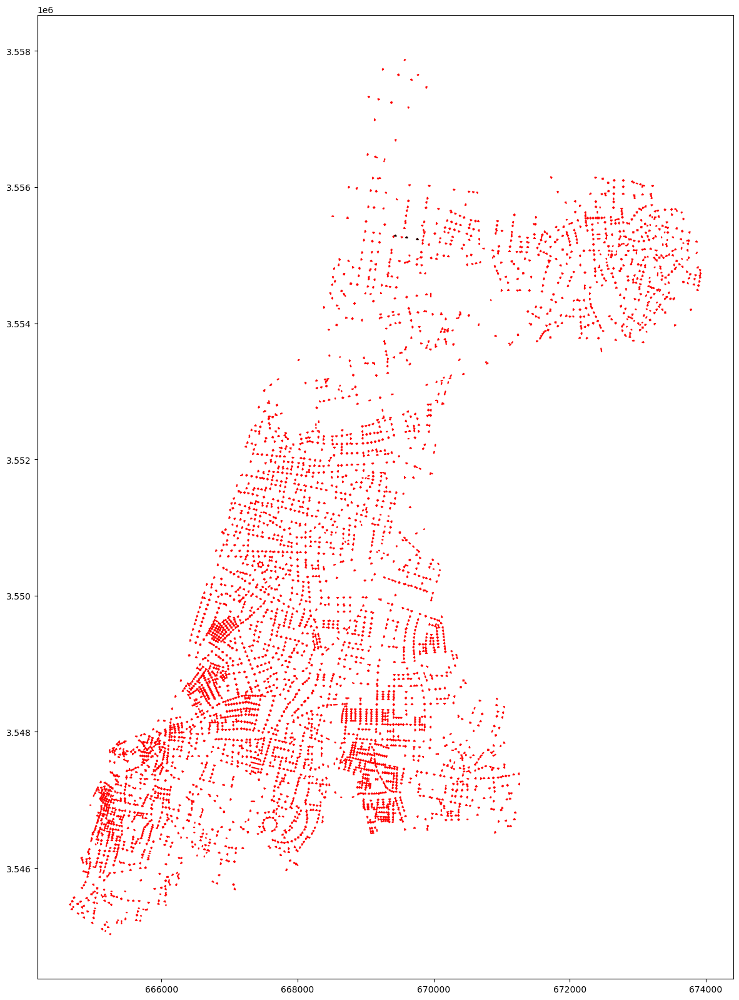

In [63]:
fig, ax = plt.subplots(figsize=(20,20))


crossroads_buff.plot(ax=ax, color='red')
crossroads_buff[crossroads_buff.combined_trechov == 'רבינא,רב אשי'].plot(ax=ax, color='black')

In [64]:
mm_accidents_in_crossroads = gpd.sjoin(i_m_h_ta_mm_acc_one_gdf,crossroads_buff, how='inner', predicate='intersects')
mm_accidents_in_crossroads

,accident_id,provider_and_id,provider_code,file_type_police,involved_type,involved_type_hebrew,license_acquiring_date,age_group,age_group_hebrew,sex,...,total_weight_hebrew,vehicle_damage,vehicle_damage_hebrew,urban_intersection,accident_date,geometry,index_right,geo_length,combined_trechov,num_trechov
196,2013000147,12013000147,1,1,2,נהג נפגע,0,8,35-39,1,...,לא ידוע,2.0,בינוני,9110323.0,2013-09-19 00:00:00,POINT (668158.751 3551284.678),3802,102.584199,"ארלוזורוב,אבן גבירול",2
197,2013000147,12013000147,1,1,2,נהג נפגע,0,6,25-29,1,...,לא ידוע,2.0,בינוני,9110323.0,2013-09-19 00:00:00,POINT (668158.751 3551284.678),3802,102.584199,"ארלוזורוב,אבן גבירול",2
251,2013001755,32013001755,3,3,2,נהג נפגע,2005,6,25-29,1,...,לא ידוע,4.0,אין נזק,11670545.0,2013-11-23 01:30:00,POINT (667291.113 3549059.667),2789,102.796858,"אלנבי,מונטיפיורי",2
257,2013002105,32013002105,3,3,1,נהג,0,7,30-34,1,...,לא ידוע,1.0,קל,7540321.0,2013-01-01 02:15:00,POINT (667511.178 3551455.462),3868,102.762023,"דיזנגוף,ארלוזורוב",2
349,2013001346,32013001346,3,3,2,נהג נפגע,0,5,20-24,2,...,לא ידוע,4.0,אין נזק,10335.0,2013-09-06 01:00:00,POINT (666916.964 3550924.250),3669,101.353967,"של""ג,הירקון",2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
111269,2024098273,32024098273,3,3,2,נהג נפגע,1980,13,60-64,1,...,לא ידוע,1.0,קל,15270924.0,2024-03-31 08:00:00,POINT (669166.347 3548129.856),2110,102.742958,"אלון יגאל,החי""ל",2
111332,2024090432,12024090432,1,1,2,נהג נפגע,1996,10,45-49,2,...,לא ידוע,1.0,קל,53040001.0,2024-04-01 19:30:00,POINT (667267.575 3546539.876),455,102.359588,"בן צבי,לבון פנחס,פרייגרזון צבי",3
111345,2024096932,32024096932,3,3,2,נהג נפגע,2023,4,15-19,1,...,לא ידוע,4.0,אין נזק,NaN,2024-02-07 18:45:00,POINT (668119.593 3549579.660),3104,101.971426,"החשמונאים,יהודה הלוי",2
111392,2024095225,32024095225,3,3,2,נהג נפגע,2019,5,20-24,1,...,לא ידוע,4.0,אין נזק,NaN,2024-03-15 09:30:00,POINT (666446.432 3548745.372),2599,87.453676,"שלוש,איל""ן",2


Plot for each year, that there are accidents the top crossroads.

In [65]:
crossroads_buff[crossroads_buff.combined_trechov.str.contains('קבוץ גלויות,איילון לכוון וולפסון')]

,geometry,geo_length,combined_trechov,num_trechov


In [164]:
# import leafmap
# m = leafmap.Map(center=(32.1, 34.8), zoom=12)
# m.add_gdf(crossroads_buff[crossroads_buff.combined_trechov.str.contains('קבוץ גלויות,איילון לכוון וולפסון')], layer_name="Streets", info_mode='on_hover', color='black')
# # m.add_gdf(crossroads_buff[crossroads_buff.combined_trechov.isin(crossroads_t10.index)], layer_name="Streets", info_mode='on_hover', color='black')

# m

In [165]:
# from plotly.subplots import make_subplots
# import plotly.graph_objects as go

# # Define the years and severities
# years = list(range(2013, 2024))  # Assuming years from 2013 to 2023
# severities = [1, 2, 3]  # Assuming severities: 1 = Killed, 2 = Seriously Injured, 3 = Lightly Injured

# # Create subplot titles
# subplot_titles = [
#     "All Years: All Severities",
#     "All Years: Killed",
#     "All Years: Seriously Injured",
#     "All Years: Lightly Injured",
# ]
# for year in years:
#     subplot_titles.extend(
#         [
#             f"{year}: All Severities",
#             f"{year}: Killed",
#             f"{year}: Seriously Injured",
#             f"{year}: Lightly Injured",
#         ]
#     )

# # Create a subplot layout with 2 rows: one for all years and one for each year
# fig = make_subplots(
#     rows=len(years) + 1, cols=4,  # First row for "All Years", subsequent rows for each year
#     subplot_titles=subplot_titles
# )

# # Row 1: Aggregated data across all years
# crossroads_all_years = (
#     mm_accidents_in_crossroads['combined_trechov']
#     .value_counts()
#     .head(10)
# )
# fig.add_trace(
#     go.Bar(
#         x=crossroads_all_years.index,
#         y=crossroads_all_years.values,
#         text=crossroads_all_years.values,
#         textposition='outside',
#         name="All Severities"
#     ),
#     row=1, col=1
# )

# for i, severity in enumerate(severities, start=2):
#     crossroads_severity_all_years = (
#         mm_accidents_in_crossroads[
#             mm_accidents_in_crossroads.accident_severity == severity
#         ]['combined_trechov']
#         .value_counts()
#         .head(10)
#     )
#     fig.add_trace(
#         go.Bar(
#             x=crossroads_severity_all_years.index,
#             y=crossroads_severity_all_years.values,
#             text=crossroads_severity_all_years.values,
#             textposition='outside',
#             name=f"Severity {severity}"
#         ),
#         row=1, col=i
#     )

# # Rows 2 to n+1: Data for each year
# for row_idx, year in enumerate(years, start=2):  # Start at row 2 for years
#     # Plot 1: All severities for the year
#     crossroads_all = (
#         mm_accidents_in_crossroads[mm_accidents_in_crossroads.accident_year == year]['combined_trechov']
#         .value_counts()
#         .head(10)
#     )
#     fig.add_trace(
#         go.Bar(
#             x=crossroads_all.index,
#             y=crossroads_all.values,
#             text=crossroads_all.values,
#             textposition='outside',
#             name="All Severities"
#         ),
#         row=row_idx, col=1
#     )
    
#     # Plot 2 to 4: Severity levels 1, 2, and 3 for the year
#     for col_idx, severity in enumerate(severities, start=2):  # Start at column 2 for severities
#         crossroads_severity = (
#             mm_accidents_in_crossroads[
#                 (mm_accidents_in_crossroads.accident_year == year) &
#                 (mm_accidents_in_crossroads.accident_severity == severity)
#             ]['combined_trechov']
#             .value_counts()
#             .head(10)
#         )
#         fig.add_trace(
#             go.Bar(
#                 x=crossroads_severity.index,
#                 y=crossroads_severity.values,
#                 text=crossroads_severity.values,
#                 textposition='outside',
#                 name=f"Severity {severity}"
#             ),
#             row=row_idx, col=col_idx
#         )

# # Update layout for better visualization
# fig.update_layout(
#     title_text="Tel Aviv Most Dangerous Crossroads by Severity and Year",
#     height=600 * (len(years) + 1),  # Adjust height dynamically
#     width=1500,  # Adjust width for all columns
#     showlegend=False,  # Disable legend to save space
#     template="plotly_white",
# )

# # Loop through all subplots to set the tickangle for x-axis
# for row_idx in range(1, len(years) + 2):  # Rows: 1 for all years + len(years)
#     for col_idx in range(1, 5):  # Columns: 4 subplots per row
#         fig.update_xaxes(
#             tickangle=-45,  # Tilt x-axis labels
#             row=row_idx,
#             col=col_idx
#         )

# # Show the plot
# fig.show()


What street segments have the most accidents

In [68]:
ta_streets_buff = ta_streets.copy()

ta_streets_buff['geometry'] = ta_streets_buff.geometry.buffer(10)
ta_streets_buff['geometry'] 

0       POLYGON ((672899.692 3554089.512, 672900.547 3...
1       POLYGON ((667066.715 3551436.436, 667067.679 3...
2       POLYGON ((667943.386 3551417.067, 667944.319 3...
3       POLYGON ((669572.412 3550448.271, 669572.884 3...
4       POLYGON ((669409.578 3548331.348, 669410.558 3...
                              ...                        
8874    POLYGON ((665769.455 3546992.131, 665769.026 3...
8875    POLYGON ((665634.457 3547148.186, 665701.636 3...
8876    POLYGON ((665763.770 3547037.782, 665775.942 3...
8877    POLYGON ((665073.353 3546669.392, 665072.374 3...
8878    POLYGON ((666928.732 3548303.793, 666958.846 3...
Name: geometry, Length: 8879, dtype: geometry

In [69]:
streets_with_accidents = gpd.sjoin(i_m_h_ta_mm_acc_one_gdf, ta_streets_buff, how='inner',predicate='intersects')
streets_with_accidents

,accident_id,provider_and_id,provider_code,file_type_police,involved_type,involved_type_hebrew,license_acquiring_date,age_group,age_group_hebrew,sex,...,oidrechov,krechov,trechov,shemangli,mslamas,tsug,kkivun,UniqueId,shemarvit,kreka
196,2013000147,12013000147,1,1,2,נהג נפגע,0,8,35-39,1,...,737.0,496.0,אבן גבירול,IBN GVIROL,1040.0,רחוב,0.0,507-10863,حجر غفيرول,200.0
197,2013000147,12013000147,1,1,2,נהג נפגע,0,6,25-29,1,...,737.0,496.0,אבן גבירול,IBN GVIROL,1040.0,רחוב,0.0,507-10863,حجر غفيرول,200.0
251,2013001755,32013001755,3,3,2,נהג נפגע,2005,6,25-29,1,...,1196.0,4.0,אלנבי,ALLENBY,1135.0,רחוב,1.0,507-11355,ألينبي,200.0
251,2013001755,32013001755,3,3,2,נהג נפגע,2005,6,25-29,1,...,4445.0,10.0,מונטיפיורי,MONTEFIORE,1255.0,רחוב,2.0,507-15164,مونتيفيور,100.0
251,2013001755,32013001755,3,3,2,נהג נפגע,2005,6,25-29,1,...,4446.0,10.0,מונטיפיורי,MONTEFIORE,1255.0,רחוב,2.0,507-15165,مونتيفيور,100.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
111394,2024095204,32024095204,3,3,2,נהג נפגע,2013,7,30-34,1,...,7287.0,11.0,אחד העם,AHAD HA'AM,1104.0,רחוב,1.0,507-18853,واحد من الناس,100.0
111394,2024095204,32024095204,3,3,2,נהג נפגע,2013,7,30-34,1,...,4058.0,358.0,בר אילן,BAR ILAN,1109.0,רחוב,1.0,507-14742,بار إيلان,100.0
111394,2024095204,32024095204,3,3,2,נהג נפגע,2013,7,30-34,1,...,1319.0,358.0,בר אילן,BAR ILAN,1109.0,רחוב,1.0,507-11487,بار إيلان,100.0
111394,2024095204,32024095204,3,3,2,נהג נפגע,2013,7,30-34,1,...,7286.0,11.0,אחד העם,AHAD HA'AM,1104.0,רחוב,1.0,507-18852,واحد من الناس,100.0


Remove overlapping accidents in streets by removing accidents that are also in mm_accidents_in_crossroads

In [70]:
streets_with_accidents_idx     = streets_with_accidents.index
mm_accidents_in_crossroads_idx = mm_accidents_in_crossroads.index

accidents_only_on_streets_idx = np.setdiff1d(streets_with_accidents_idx,mm_accidents_in_crossroads_idx)


streets_with_accidents_no_crossroads= streets_with_accidents.loc[accidents_only_on_streets_idx]
streets_with_accidents_no_crossroads


,accident_id,provider_and_id,provider_code,file_type_police,involved_type,involved_type_hebrew,license_acquiring_date,age_group,age_group_hebrew,sex,...,oidrechov,krechov,trechov,shemangli,mslamas,tsug,kkivun,UniqueId,shemarvit,kreka
455,2013002036,12013002036,1,1,2,נהג נפגע,0,6,25-29,2,...,604.0,25.0,בן יהודה,BEN-YEHUDA,510.0,רחוב,1.0,507-10725,بن يهودا,200.0
543,2013000191,12013000191,1,1,2,נהג נפגע,0,12,55-59,1,...,8998.0,3311.0,קבוץ גלויות,Kibbuts Galuiot,2309.0,דרך,0.0,507-12123,بطاقات بريدية Kabbalah,200.0
593,2013000876,12013000876,1,1,2,נהג נפגע,0,7,30-34,1,...,1887.0,2.0,הרצל,HERZL,2215.0,רחוב,0.0,507-12195,هرتسل,200.0
598,2013003864,32013003864,3,3,2,נהג נפגע,0,8,35-39,1,...,3322.0,842.0,"צה""ל",TSAHAL,301.0,רחוב,1.0,507-13883,IDF,100.0
639,2013003874,12013003874,1,1,2,נהג נפגע,0,11,50-54,1,...,165.0,2141.0,בן יוסף שלמה,BEN YOSEF,282.0,רחוב,0.0,507-10211,بن يوسف شلومو,100.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
111275,2024093992,32024093992,3,3,2,נהג נפגע,0,7,30-34,1,...,1394.0,475.0,המסגר,HAMASGER,1554.0,רחוב,0.0,507-11578,الأقفال,100.0
111291,2024094789,32024094789,3,3,2,נהג נפגע,2017,6,25-29,2,...,1783.0,3557.0,אבולעפיה,CYAYIN ABUL'AFIA,1632.0,רחוב,1.0,507-12044,Abulafia,100.0
111304,2024091837,32024091837,3,3,2,נהג נפגע,2018,6,25-29,1,...,1357.0,2237.0,מוזס יהודה ונח,MOZES,2572.0,רחוב,0.0,507-11531,موسى يهودا ونوح,100.0
111326,2024098833,32024098833,3,3,1,נהג,0,99,לא ידוע,0,...,4982.0,1007.0,"הפלמ""ח",HAPALMAH,2644.0,רחוב,2.0,507-15779,بالاش,100.0


In [166]:
# import plotly.graph_objects as go
# from plotly.subplots import make_subplots

# # Define the years and severity levels
# years = list(range(2013, 2024))  # Assuming years from 2013 to 2023
# severities = [1, 2, 3]  # Assuming severities: 1 = Killed, 2 = Seriously Injured, 3 = Lightly Injured

# # Create subplot titles
# subplot_titles = [
#     "All Years: All Severities",
#     "All Years: Killed",
#     "All Years: Seriously Injured",
#     "All Years: Lightly Injured",
# ]
# for year in years:
#     subplot_titles.extend(
#         [
#             f"{year}: All Severities",
#             f"{year}: Killed",
#             f"{year}: Seriously Injured",
#             f"{year}: Lightly Injured",
#         ]
#     )

# # Create a subplot layout
# fig = make_subplots(
#     rows=len(years) + 1, cols=4,  # First row for "All Years", subsequent rows for each year
#     subplot_titles=subplot_titles
# )

# # Row 1: Aggregated data across all years
# streets_all_years = (
#     streets_with_accidents_no_crossroads['trechov']
#     .value_counts()
#     .head(10)
# )
# fig.add_trace(
#     go.Bar(
#         x=streets_all_years.index,
#         y=streets_all_years.values,
#         text=streets_all_years.values,
#         textposition='outside',
#         name="All Severities"
#     ),
#     row=1, col=1
# )

# for i, severity in enumerate(severities, start=2):
#     streets_severity_all_years = (
#         streets_with_accidents_no_crossroads[
#             streets_with_accidents_no_crossroads.accident_severity == severity
#         ]['trechov']
#         .value_counts()
#         .head(10)
#     )
#     fig.add_trace(
#         go.Bar(
#             x=streets_severity_all_years.index,
#             y=streets_severity_all_years.values,
#             text=streets_severity_all_years.values,
#             textposition='outside',
#             name=f"Severity {severity}"
#         ),
#         row=1, col=i
#     )

# # Rows 2 to n+1: Data for each year
# for row_idx, year in enumerate(years, start=2):
#     # Plot 1: All severities for the year
#     t10_streets_by_accidents = (
#         streets_with_accidents_no_crossroads[streets_with_accidents_no_crossroads.accident_year == year]['trechov']
#         .value_counts()
#         .head(10)
#     )
#     fig.add_trace(
#         go.Bar(
#             x=t10_streets_by_accidents.index,
#             y=t10_streets_by_accidents.values,
#             text=t10_streets_by_accidents.values,
#             textposition='outside',
#             name="All Severities"
#         ),
#         row=row_idx, col=1
#     )
    
#     # Plot 2 to 4: Severity levels 1, 2, and 3 for the year
#     for col_idx, severity in enumerate(severities, start=2):
#         t10_streets_by_accidents_and_severity = (
#             streets_with_accidents_no_crossroads[
#                 (streets_with_accidents_no_crossroads.accident_year == year) &
#                 (streets_with_accidents_no_crossroads.accident_severity == severity)
#             ]['trechov']
#             .value_counts()
#             .head(10)
#         )
#         fig.add_trace(
#             go.Bar(
#                 x=t10_streets_by_accidents_and_severity.index,
#                 y=t10_streets_by_accidents_and_severity.values,
#                 text=t10_streets_by_accidents_and_severity.values,
#                 textposition='outside',
#                 name=f"Severity {severity}"
#             ),
#             row=row_idx, col=col_idx
#         )

# # Update layout for better visualization
# fig.update_layout(
#     title_text="Tel Aviv Most Dangerous Streets by Severity and Year",
#     height=600 * (len(years) + 1),  # Adjust height dynamically
#     width=1300,  # Adjust width for all columns
#     showlegend=False,  # Disable legend to save space
#     template="plotly_white",
# )

# # Loop through all subplots to tilt x-axis labels
# for row_idx in range(1, len(years) + 2):  # Rows: 1 for all years + len(years)
#     for col_idx in range(1, 5):  # Columns: 4 subplots per row
#         fig.update_xaxes(
#             tickangle=-45,  # Tilt x-axis labels
#             row=row_idx,
#             col=col_idx
#         )

# # Show the plot
# fig.show()


### Checking crossroads that have taken unrelated roads

In [72]:
# First check crossroads with the most streets.
crossroads_buff.num_trechov.sort_values().tail(50)

2212     5
1027     5
1836     5
902      5
2497     5
3203     5
3057     5
5540     5
2830     5
1717     5
2956     5
4825     5
600      5
966      5
1899     5
1003     5
2081     5
3088     5
4838     5
5410     5
1379     5
660      5
4246     5
2473     5
592      5
3629     5
797      5
1896     5
1951     5
1799     5
1655     6
2073     6
1849     6
1677     6
2644     6
1369     6
1113     6
1632     6
881      6
1619     6
394      6
1470     7
1698     7
1107     7
733      7
1121     7
1436     8
978      8
2466     9
2508    10
Name: num_trechov, dtype: int64

In [73]:
orig_cross_with_created_cross = gpd.sjoin(ta_crossroads_from_streets, crossroads_buff[['combined_trechov','geometry','num_trechov']])

orig_idx_to_check = orig_cross_with_created_cross[orig_cross_with_created_cross.combined_trechov.str.contains('קבוץ גלויות,8161,איילון')].index
orig_idx_to_check

Index([], dtype='int64')

In [74]:
# import leafmap
# m = leafmap.Map(center=(32.047, 34.785), zoom=11)
# # m.add_gdf(crossroads_buff[crossroads_buff.combined_trechov.str.contains('קבוץ גלויות,איילון לכוון וולפסון')], layer_name="Streets", fill_colors='black', zoom_to_layer=True)
# # m.add_gdf(orig_cross_with_created_cross[orig_cross_with_created_cross.combined_trechov.str.contains('קבוץ גלויות,איילון לכוון וולפסון')], layer_name="Streets", fill_colors='black', zoom_to_layer=True)
# m.add_gdf(ta_crossroads_from_streets.loc[orig_idx_to_check], layer_name="crossroad_to_check", fill_colors='black', zoom_to_layer=True)
# # m.add_gdf(ta_streets, layer_name="Streets", fill_colors='black',)
# # m.add_gdf(ta_crossroads, layer_name="Streets", fill_colors='black',)

# m

We see issues with our map, "קיבוץ גלויות" is a two way street but only one line string, when connecting to other streets it creates a connection that is missing the real street connections.

Hence the crossroads are misaligned. 

---

Trying Open Street Map

In [75]:
import networkx as nx
import osmnx as ox

In [76]:
G = ox.graph_from_place("Tel Aviv, Israel", network_type="drive")

In [77]:
# you can convert your graph to node and edge GeoPandas GeoDataFrames
gdf_nodes, gdf_edges = ox.graph_to_gdfs(G)
gdf_nodes = gdf_nodes.to_crs('32636')
gdf_edges = gdf_edges.to_crs('32636')
gdf_nodes.head()

,y,x,highway,street_count,ref,geometry
osmid,,,,,,
139693,32.093840,34.790572,traffic_signals,4,NaN,POINT (668968.683 3552240.237)
139698,32.093869,34.791231,NaN,3,NaN,POINT (669030.815 3552244.552)
139707,32.095354,34.778500,NaN,3,NaN,POINT (667826.578 3552389.242)
139708,32.095052,34.778329,NaN,3,NaN,POINT (667810.983 3552355.494)
139709,32.094527,34.778842,NaN,4,NaN,POINT (667860.387 3552298.098)


In [163]:
# fig, ax = plt.subplots(figsize=(20,20))

# gdf_edges.plot(ax=ax, color='black')

So after viewing the data from Open Street Map, it seems very well made.

When exploring further I found there are roads with no name (nan).<br>
It presents a challenge what to call them, in general these are roads that connect between streets.

**Potential problems:**

**Naming:** naming should be "street1 connects to street2".<br>
A potential issue is how to tell which streets connect to the other.<br>
One idea is to treat them as a right turn, if they are a right turn then we can use the street curve to determine where which street are connecting to which.

**roundabouts:** problem arises when looking at roundabouts, sometimes there is a road between to an entry road and an exist road, looking at the right turn will not help us get it's name.
**Solution:** Maybe roundabout should be treated as a whole, get all the roundabout connected them to a single polygon and connect with the streets that connect them.

**Tunnels:** they pass under other streets so when finding accidents it might assign an accident from the street above
**Solution** check the name of the street to make sure to assign the accident properly.

**Wrong crossroads:** the top blue circle, a crossroad, isn't an actual crossroad, it actually going under the street the crossroad is shown.
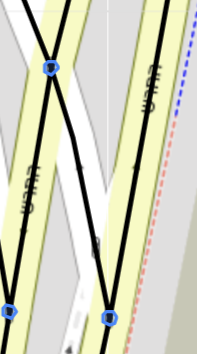

Found out there are some street that it is possible to turn left to them, maybe they have a traffic signal(stop light)

AND NO, there can be right turn with a traffic signal (from איילון to זבוטינסקי)


#### **DECISiON:** when creating crossroads where street1 is known but street2 in nan we will take street 2 and find where it's end point touches another street.<br>
The name will be "street1 connector(road with nan) street2(end point touches another street)"

---

Trying another idea, take the start point in all na roads turn to a polygon and check on the map does it corresponds to actual beginning of the road if it is we can use the end point to get the name of street2.

IT WORKS!

We will use the fact that a start point indicates the direction, so a road that connect between hashalom and alenbi that has a start point at alenbi.<br>
It's direction is alenbi to hashalom 



### Plan:
I am going to recreate the crossroads.

The general plan:
1. [X] take roundabouts and turn them to a single line
2. [X] give edges with names that are nan a name
3. [X] return unnamed roads
4. [X] split the roads in half like I did previously with **split_linestrings_by_length**
5. [X] Drop duplicates
6. [X] merge crossroads_ox with roundabout_with_info

In [79]:
gdf_edges.junction.value_counts()

junction
roundabout    505
circular        3
Name: count, dtype: int64

In [80]:
gdf_edges[gdf_edges['junction'] == 'circular']

,,,osmid,oneway,name,highway,reversed,length,geometry,maxspeed,lanes,ref,access,tunnel,bridge,junction,width
u,v,key,,,,,,,,,,,,,,,
412519847,9399427381,0,"[229938809, 1019049227]",True,"[כיכר דיזנגוף (צינה), דיזנגוף]",tertiary,False,154.641,"LINESTRING (667427.049 3550580.488, 667438.054...",NaN,2,NaN,NaN,NaN,NaN,circular,NaN
2144024859,412520369,0,"[1134725835, 1019049228, 204856710]",True,"[כיכר דיזנגוף (צינה), דיזנגוף, ריינס]",tertiary,False,265.489,"LINESTRING (667483.719 3550338.312, 667481.273...",NaN,1,NaN,NaN,NaN,NaN,circular,NaN
9399427381,2541845407,0,"[247269138, 1019049227]",True,"[דיזנגוף, כיכר דיזנגוף (צינה)]",tertiary,False,126.558,"LINESTRING (667421.693 3550437.088, 667426.951...",NaN,NaN,NaN,NaN,NaN,NaN,circular,NaN


### take roundabouts and turn them to a single line

In [81]:
# Step 1: Buffer and create roundabout polygons
roundabouts = gdf_edges[gdf_edges.junction == 'roundabout'].copy()
roundabouts['geometry'] = roundabouts.buffer(1)
roundabouts_geometry = unary_union(roundabouts.geometry)

# Create polygons GeoDataFrame
roundabouts_poly = gpd.GeoDataFrame(geometry=[roundabouts_geometry], crs=roundabouts.crs)
roundabouts_poly = roundabouts_poly.explode(index_parts=True).reset_index(drop=True)

# Step 2: Assign unique IDs to roundabout polygons
roundabouts_poly['poly_id'] = roundabouts_poly.index

# Step 3: Spatial join to associate edges with polygons
edges_with_polygons = gpd.sjoin(roundabouts, roundabouts_poly, how='inner', predicate='intersects')

# Step 4: Analyze or group information
# Example: For each polygon, find the first edge's data
roundabouts_with_info = (
    edges_with_polygons.groupby('poly_id')
    .first()  # Select the first edge information for each polygon
    .reset_index()
)

# View the resulting dataframe
roundabouts_with_info['geometry'] = roundabouts_poly.geometry
roundabouts_with_info


,poly_id,osmid,oneway,name,highway,reversed,length,geometry,maxspeed,lanes,ref,access,tunnel,bridge,junction,width,index_right
0,0,159555091,True,None,tertiary,False,1.317,"POLYGON ((664987.697 3545203.066, 664987.712 3...",None,None,None,None,None,None,roundabout,None,0
1,1,742719147,True,None,tertiary,False,20.654,"POLYGON ((665604.642 3545525.137, 665604.651 3...",None,None,None,None,None,None,roundabout,None,1
2,2,113140773,True,None,tertiary,False,10.751,"POLYGON ((664907.429 3545553.230, 664907.423 3...",None,None,None,None,None,None,roundabout,None,2
3,3,925514478,True,None,residential,False,16.055,"POLYGON ((665187.533 3545578.514, 665187.541 3...",None,None,None,None,None,None,roundabout,None,3
4,4,132638933,True,None,residential,False,37.276,"POLYGON ((666387.375 3545959.283, 666387.370 3...",None,None,None,None,None,None,roundabout,None,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
108,108,31651913,True,None,tertiary,False,18.347,"POLYGON ((669094.360 3555949.980, 669094.355 3...",None,None,None,None,None,None,roundabout,None,108
109,109,35373026,True,None,residential,False,43.276,"POLYGON ((670006.499 3556007.037, 670006.499 3...",None,None,None,None,None,None,roundabout,None,109
110,110,31651960,True,None,residential,False,8.331,"POLYGON ((669111.898 3556123.751, 669111.871 3...",None,None,None,None,None,None,roundabout,None,110
111,111,1173903897,True,None,residential,False,14.612,"POLYGON ((669623.940 3557159.025, 669623.936 3...",None,None,None,None,None,None,roundabout,None,111


### give edges with nan names a proper name

In [82]:
# Step 1: Filter edges with no name
unnamed_roads = gdf_edges[gdf_edges.name.isna()].copy()

In [83]:
import osmnx as ox
from shapely.geometry import Point

# Ensure CRS is consistent between GeoDataFrames

# Step 1: Extract start and end points from each LineString in 'unnamed_roads'
def get_start_and_end_points(line):
    return line.coords[0], line.coords[-1]

unnamed_roads['start_point'], unnamed_roads['end_point'] = zip(*unnamed_roads['geometry'].apply(get_start_and_end_points))

# Step 2: Convert start and end points to shapely Points
unnamed_roads['start_point'] = unnamed_roads['start_point'].apply(lambda x: Point(x))
unnamed_roads['end_point'] = unnamed_roads['end_point'].apply(lambda x: Point(x))

# Step 3: Find the closest edge in `ta_streets` for each point
def find_closest_edge(point, ta_streets):
    # Find the nearest edge and return its index
    edge_idx = ta_streets.distance(point).idxmin()
    return edge_idx

unnamed_roads['start_edge_idx'] = unnamed_roads['start_point'].apply(find_closest_edge, ta_streets=ta_streets)
unnamed_roads['end_edge_idx'] = unnamed_roads['end_point'].apply(find_closest_edge, ta_streets=ta_streets)

# Step 4: Retrieve the 'trechov' value of the closest edges
unnamed_roads['start_trechov'] = unnamed_roads['start_edge_idx'].apply(lambda idx: ta_streets.loc[idx, 'trechov'])
unnamed_roads['end_trechov'] = unnamed_roads['end_edge_idx'].apply(lambda idx: ta_streets.loc[idx, 'trechov'])

# Step 5: Assign the new name based on the trechov values
# Optionally combine both start and end names or use one
unnamed_roads['new_name'] = unnamed_roads['start_trechov']  # Use start trechov value as an example

# Final result
unnamed_roads[['new_name']]


new_name
u           v           key                   
1226885     2989957353  0         גבעת התחמושת
1227320     2473987496  0           אבן גבירול
1228104     442898687   0                השלום
1228344     2481705198  0           בר-לב חיים
1329714     17703741    0                השלום
...                                        ...
12120460101 12120460109 0    זלצמן פנינה פרופ'
12120460109 12120455200 0    זלצמן פנינה פרופ'
            9931532351  0    זלצמן פנינה פרופ'
12287814424 2213119636  0     נתיבי אילון דרום
12361383714 2108063253  0                 אילת

[1295 rows x 1 columns]

In [84]:
def get_new_name(row):
    start_name = row['start_trechov']
    end_name = row['end_trechov']

    # Unicode marks for RTL and LTR handling
    RLM = '\u200F'  # Right-to-Left Mark
    LRM = '\u200E'  # Left-to-Right Mark

    if start_name == end_name:
        return RLM + start_name  # Apply RLM to enforce correct order

    # Combine names with RLM for proper display
    combined_name = f"{RLM}{start_name} ל {RLM}{end_name}"
    return combined_name


In [85]:
unnamed_roads['new_name'] = unnamed_roads.apply( get_new_name, axis=1)

In [86]:
unnamed_roads_mask = unnamed_roads.index

gdf_edges.loc[unnamed_roads_mask,'name'] = unnamed_roads['new_name']
gdf_edges.loc[unnamed_roads_mask,'name']

u            v            key
1226885      2989957353   0      ‏גבעת התחמושת ל ‏נתיבי אילון דרום
1227320      2473987496   0                            ‏אבן גבירול
1228104      442898687    0                     ‏השלום ל ‏דיין משה
1228344      2481705198   0                ‏בר-לב חיים ל ‏דיין משה
1329714      17703741     0                   ‏השלום ל ‏עלית הנוער
                                               ...                
12120460101  12120460109  0                     ‏זלצמן פנינה פרופ'
12120460109  12120455200  0         ‏זלצמן פנינה פרופ' ל ‏יוניצ'מן
             9931532351   0             ‏זלצמן פנינה פרופ' ל ‏2379
12287814424  2213119636   0                      ‏נתיבי אילון דרום
12361383714  2108063253   0                    ‏אילת ל ‏הרבי מבכרך
Name: name, Length: 1295, dtype: object

### return unnamed roads

In [87]:
gdf_nodes_buff = gdf_nodes.copy()
gdf_nodes_buff['geometry'] = gdf_nodes_buff.buffer(1)

### split the roads in half like I did previously with **split_linestrings_by_length**

In [88]:
gdf_edges_no_roundabout = gdf_edges[~(gdf_edges.junction == 'roundabout')].copy()

In [89]:
gdf_edges_no_roundabout_split = split_linestrings_by_length(gdf_edges_no_roundabout)
gdf_edges_no_roundabout_split.head()


,osmid,oneway,name,highway,reversed,length,geometry,maxspeed,lanes,ref,access,tunnel,bridge,junction,width
0,167691710,True,יהודה המכבי,tertiary,False,62.173,"LINESTRING (668968.683 3552240.237, 668978.671...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,167691710,True,יהודה המכבי,tertiary,False,62.173,"LINESTRING (669020.844 3552243.787, 669030.815...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,167691710,True,יהודה המכבי,tertiary,False,110.029,"LINESTRING (669030.815 3552244.552, 669040.771...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,167691710,True,יהודה המכבי,tertiary,False,110.029,"LINESTRING (669130.394 3552255.903, 669140.303...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,26516058,False,ירמיהו,residential,False,37.249,"LINESTRING (667826.578 3552389.242, 667822.383...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [90]:
gdf_edges_no_roundabout_split['name_type'] = gdf_edges_no_roundabout_split.name.apply(type)
gdf_edges_no_roundabout_split[gdf_edges_no_roundabout_split['name_type'] != list].head()

,osmid,oneway,name,highway,reversed,length,geometry,maxspeed,lanes,ref,access,tunnel,bridge,junction,width,name_type
0,167691710,True,יהודה המכבי,tertiary,False,62.173,"LINESTRING (668968.683 3552240.237, 668978.671...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,<class 'str'>
1,167691710,True,יהודה המכבי,tertiary,False,62.173,"LINESTRING (669020.844 3552243.787, 669030.815...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,<class 'str'>
2,167691710,True,יהודה המכבי,tertiary,False,110.029,"LINESTRING (669030.815 3552244.552, 669040.771...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,<class 'str'>
3,167691710,True,יהודה המכבי,tertiary,False,110.029,"LINESTRING (669130.394 3552255.903, 669140.303...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,<class 'str'>
4,26516058,False,ירמיהו,residential,False,37.249,"LINESTRING (667826.578 3552389.242, 667822.383...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,<class 'str'>


In [91]:
import geopandas as gpd
from shapely.ops import unary_union

# Step 1: Buffer the geometries to ensure overlaps
gdf_edges_no_roundabout_split['geometry'] = gdf_edges_no_roundabout_split[
    gdf_edges_no_roundabout_split['name_type'] != list
].copy().buffer(7)

# Step 2: Identify and dissolve overlapping polygons to create crossroads
crossroads_geometry = unary_union(gdf_edges_no_roundabout_split['geometry'])

# Convert the merged geometry into a GeoDataFrame
crossroads_gdf = gpd.GeoDataFrame(geometry=list(crossroads_geometry.geoms), crs=gdf_edges_no_roundabout_split.crs)

# Step 4: Spatially join road segments with crossroads
print("Spatially joining road segments with crossroads...")
road_crossroad_join = gpd.sjoin(gdf_edges_no_roundabout_split, crossroads_gdf, predicate="intersects")

# Step 5: Group and aggregate names for each crossroad
print("Aggregating road names for each crossroad...")
crossroads_gdf['crossroad_names'] = (
    road_crossroad_join.groupby('index_right')['name']
    .apply(lambda names: ' ,'.join(sorted(set(names))))
    .reset_index(drop=True)
)

# Step 6: Final result GeoDataFrame with crossroads geometries and their names
print("Finalizing results...")
crossroads_result = crossroads_gdf[['geometry', 'crossroad_names']].reset_index(drop=True)
crossroads_result['num_names'] = crossroads_result['crossroad_names'].apply(lambda x: x.count(',') + 1)

# Step 7: Display or save the result
print("Processing complete. Crossroads created.")
crossroads_result.head()


Spatially joining road segments with crossroads...
Aggregating road names for each crossroad...
Finalizing results...
Processing complete. Crossroads created.


,geometry,crossroad_names,num_names
0,"POLYGON ((665223.903 3545036.282, 665223.357 3...","הגבול (שמחה הולצברג) ,שדרות ירושלים",2
1,"POLYGON ((665171.756 3545069.916, 665171.756 3...",הגבול (שמחה הולצברג),1
2,"POLYGON ((665128.378 3545097.692, 665128.326 3...","ברוך קרוא ,הגבול (שמחה הולצברג)",2
3,"POLYGON ((665209.001 3545126.908, 665208.452 3...",זלמן מייזל,1
4,"POLYGON ((665169.522 3545153.636, 665168.109 3...","ברוך קרוא ,זלמן מייזל",2


In [96]:
# import leafmap
# m = leafmap.Map(center=(32.047, 34.785), zoom=11)
# m.add_gdf(crossroads_result)
# m.add_gdf(gdf_nodes_buff,fill_colors='black')

# m

## Issues to handle:

1. 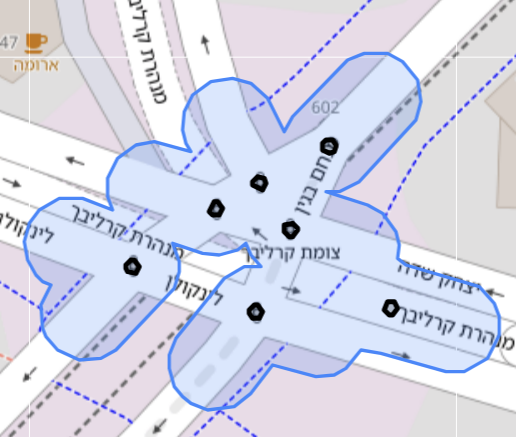
    maybe some accidents will reside in that gap.
    * to handle it, try convex_hull to create a polygon between all residing points
    * make the points of nodes with bigger radius, 5 or more that will cover
      then merge with the crossroad_polygon
2.  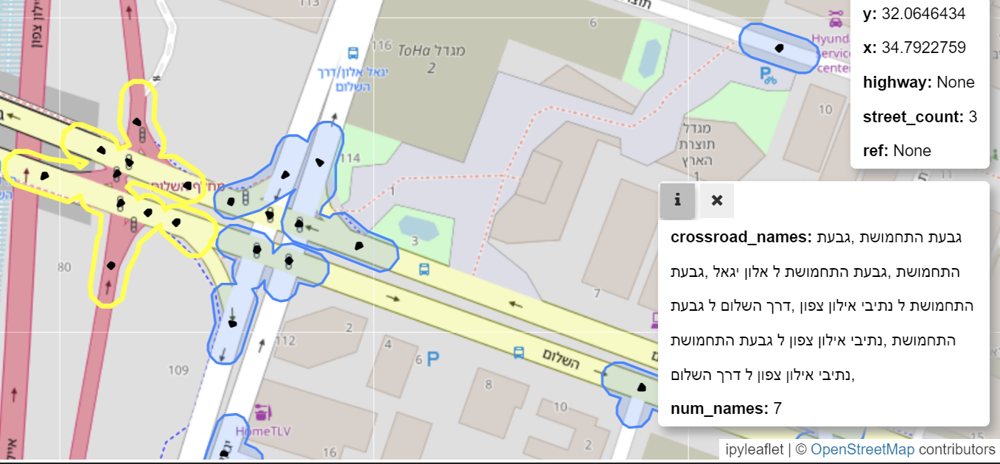
    too many polygons merged some of them belong to roads that are below.
    * create another crossroad_result with smaller buffer and where ever there are a lot of different roads that
      intersect with the smaller poly replace with smaller poly.
      * maybe look at the individual polygons, check the linestring that reside in all of them, if the street names go from one to the other in the area of the polygon that means they all belong to the same road (I hope)
3. 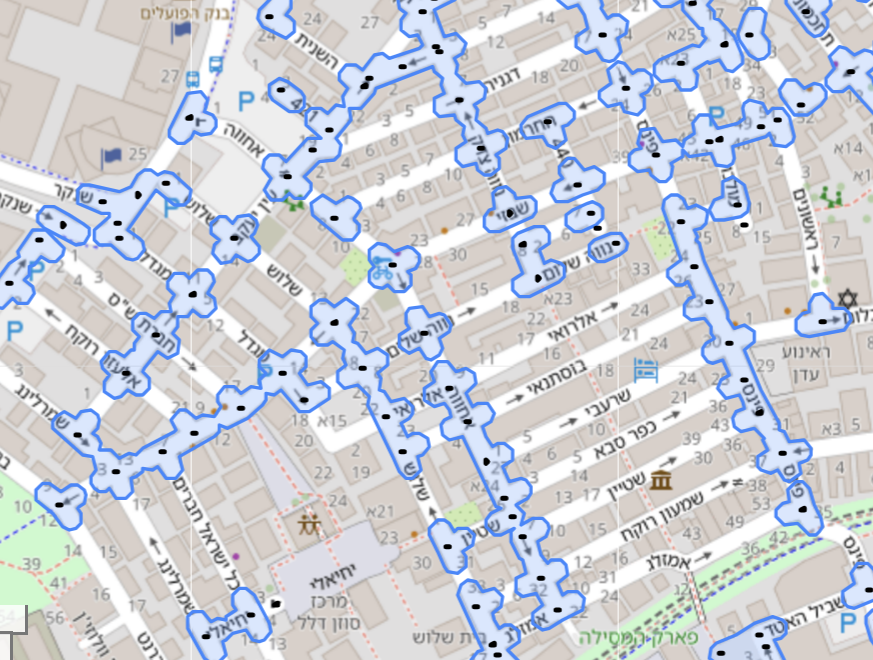
    very small streets that are very close by, merging creates a big blob
    * maybe have a list of these streets and create just for them smaller buffer 

### fixing gaps in large crossroads

1. get the crossroads with large number of street names or large area
2. get the nodes that reside in these crossroads using sjoin
3. preform some gpd grouping so the points will be considered under one geo object
4. preform convex hull
5. check if the result covers the gap and make sure no other issue arises instead
6. merge with the crossroad

#### Is a polygon considered large using area divided by longest line in polygon

Was gonna use this to find polygons with holes, found a better solution.

will keep this, maybe it can help identify problematic polygons such long streets that are connected. 

In [102]:
import geopandas as gpd
from shapely.geometry import Polygon
from scipy.spatial import distance_matrix
import numpy as np

# Function to calculate the longest line using the convex hull
def longest_line_convex_hull(polygon):
    # Step 1: Compute the convex hull
    hull = polygon.convex_hull
    
    # Step 2: Get the coordinates of the convex hull
    coords = np.array(hull.exterior.coords)
    
    # Step 3: Compute pairwise distances
    dist_matrix = distance_matrix(coords, coords)
    
    # Step 4: Find the maximum distance
    max_dist = np.max(dist_matrix)
    return max_dist



crossroads_result["longest_line"] = crossroads_result["geometry"].apply(longest_line_convex_hull)
crossroads_result["area"] = crossroads_result["geometry"].area

In [104]:
crossroads_result['line_area_ratio'] = crossroads_result['area'] / crossroads_result['longest_line']
crossroads_result

,geometry,crossroad_names,num_names,longest_line,area,line_area_ratio
0,"POLYGON ((665223.903 3545036.282, 665223.357 3...","הגבול (שמחה הולצברג) ,שדרות ירושלים",2,27.905024,422.298092,15.133407
1,"POLYGON ((665171.756 3545069.916, 665171.756 3...",הגבול (שמחה הולצברג),1,33.999954,433.690238,12.755612
2,"POLYGON ((665128.378 3545097.692, 665128.326 3...","ברוך קרוא ,הגבול (שמחה הולצברג)",2,33.998616,552.009907,16.236247
3,"POLYGON ((665209.001 3545126.908, 665208.452 3...",זלמן מייזל,1,24.000000,293.690876,12.237120
4,"POLYGON ((665169.522 3545153.636, 665168.109 3...","ברוך קרוא ,זלמן מייזל",2,33.997099,671.108838,19.740179
...,...,...,...,...,...,...
4238,"POLYGON ((669861.829 3557804.584, 669861.474 3...","2379 ,‏2379 ל ‏זלצמן פנינה פרופ' ,‏זלצמן פנינה...",3,33.999991,548.284255,16.126012
4239,"POLYGON ((669581.007 3557709.610, 669580.449 3...",פרופ' פנינה זלצמן,1,29.014727,415.258476,14.311990
4240,"POLYGON ((669253.728 3557716.719, 669253.092 3...","2170 ,יוניצמן",2,44.062644,585.691085,13.292236
4241,"POLYGON ((669571.569 3557882.344, 669571.589 3...","2379 ,2425",2,33.998351,551.860159,16.231968


line_area_ratio will help identify large polygons that are long meaning they are connected streets and not actual crossroads.

This is done as such:

longest_line is considered the hypotenuse of a right angled triangle or half a rectangle.<br>
a rectangles of the same circumfuse can have different area, the largest area is when the circumfuse is of a square.

the hypotenuse in a square will be the smallest of these kind of rectangles<br>
so area/longest_line result will increase for crossroads that are closer resemble to a square.

this can help us filter connected streets.

#### Finding polygons with holes and fill the gap

In [144]:
# Add a column to check if polygons have holes
crossroads_result["has_holes"] = crossroads_result["geometry"].apply(lambda poly: len(poly.interiors))

In [147]:
crossroads_result[crossroads_result["has_holes"] > 0].head(5)

,geometry,crossroad_names,num_names,longest_line,area,line_area_ratio,has_holes
53,"POLYGON ((664925.922 3545518.925, 664925.521 3...","אפלטון ,אריסטו ,יפת",3,73.857772,1780.736251,24.110343,1
85,"POLYGON ((665164.680 3545810.700, 665160.179 3...","יפת ,נגיב מחפוז ,‏יפת ,‏יפת ל ‏פיקוס ,‏פיקוס ל...",5,65.704381,1501.664510,22.854861,1
89,"POLYGON ((666302.274 3545840.192, 666301.597 3...","הלוחמים ,‏הלוחמים ,‏הלוחמים ל ‏ידין יגאל ,‏ידי...",4,106.546598,2268.085295,21.287262,1
144,"POLYGON ((665330.694 3546135.982, 665330.441 3...","3175 ,אסף הרופא ,יפת",3,52.775772,1257.053003,23.818752,1
208,"POLYGON ((666725.132 3546381.142, 666731.967 3...","גרינבוים ,מאיר גרוסמן",2,59.686793,1892.121714,31.700844,1


In [ ]:
from shapely.geometry import Point, MultiPoint
crossroad_with_holes = crossroads_result[crossroads_result["has_holes"] > 0].copy()
points_in_CR_with_holes = gpd.sjoin(gdf_nodes, crossroad_with_holes, predicate='intersects')
# Group points by polygon (index_right) and aggregate
grouped_points_in_CR_w_h = points_in_CR_with_holes.groupby("index_right")["geometry"].apply(lambda x: MultiPoint(x.tolist()))

# Convert back to GeoDataFrame
grouped_points_CR_w_h = gpd.GeoDataFrame(grouped_points_in_CR_w_h, columns=["geometry"], crs=ta_streets.crs)
grouped_points_CR_w_h = grouped_points_CR_w_h.set_geometry("geometry")
# Ensure grouped_points_CR_w_h is still a GeoDataFrame after operations
grouped_points_CR_w_h['geometry'] = grouped_points_CR_w_h['geometry'].convex_hull
grouped_points_CR_w_h['geometry'] = grouped_points_CR_w_h['geometry'].buffer(5)
grouped_points_CR_w_h

,geometry
index_right,
53,"POLYGON ((664929.688 3545533.802, 664929.933 3..."
85,"POLYGON ((665161.546 3545812.551, 665161.034 3..."
89,"POLYGON ((666310.984 3545844.272, 666310.501 3..."
144,"POLYGON ((665332.297 3546148.004, 665332.302 3..."
208,"POLYGON ((666713.651 3546354.011, 666713.248 3..."
...,...
3754,"POLYGON ((671519.494 3554965.267, 671519.013 3..."
3804,"POLYGON ((671905.601 3555080.051, 671905.531 3..."
3864,"POLYGON ((671576.965 3555215.502, 671576.504 3..."


In [157]:
grouped_points_CR_w_h.columns

Index(['geometry', 'emtpy_col'], dtype='object')

In [162]:
# import leafmap
# m = leafmap.Map(center=(32.047, 34.785), zoom=11)
# # m.add_gdf(crossroads_result.sort_values(by='line_area_ratio').tail(50),fill_colors=['red'])
# m.add_gdf(crossroads_result[crossroads_result["has_holes"] > 0] ,fill_colors=['red'])
# m.add_gdf(grouped_points_CR_w_h)

# m